## Introduction

In this notebook, I modified the processes of Gao (2018) paper where they used GMM and Random Forest (RF) to get the membership for M67 open cluster. The specific changes and their justifications are explained in Section 4.5 and 5.3 for GMM and RF, respectively.

In this analysis, we used the distance of the cluster center reported by Cantat et.al. (2020).

## Reference

* Cantat-Gaudin, T., & Anders, F. (2020). Clusters and mirages: Cataloguing stellar aggregates in the Milky Way. Astronomy and Astrophysics. 633, A99. https://doi.org/10.1051/0004-6361/201936691 

* Gao, X. (2018). A Machine-learning-based Investigation of the Open Cluster M67. *The Astrophysical Journal*, 869(1). https://doi.org/10.3847/1538-4357/aae8dd

## Replication

### Importing packages

In [1]:
#!pip install sklearn --upgrade

In [2]:
# uncomment for colab or for first time installment
#!pip install astroquery

In [3]:
# uncomment for colab or for first time installment
#!pip install shap

import shap

In [4]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier
from sklearn.mixture import GaussianMixture

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, classification_report

from sklearn.model_selection import RandomizedSearchCV

In [5]:
# import astroquery
import astropy.units as u
import astropy.coordinates as coord
from astroquery.gaia import Gaia
from astroquery.gaia import TapPlus, GaiaClass   
from astroquery.vizier import Vizier
import warnings
warnings.filterwarnings('ignore')

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


### Finding GAIA Data

In [6]:
# making a GAIA cone_search of 1 degree radius around M67 center. We are using 
# DR2 (2nd data release) as we can compare with the Gao (2018) paper that used DR2

coordinate = coord.SkyCoord.from_name('M67')
print(coordinate)
radius = u.Quantity(1, u.deg)
Gaia.ROW_LIMIT = -1
# table = "gaiaedr3.gaia_source"
table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius)
r = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (132.846, 11.814)>
INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [7]:
## save the ASCII table as a panadas dataframe
all_stars = r.to_pandas()
all_stars


,solution_id,DESIGNATION,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,NaN,200111.0,1.939404,1.750837,2.115395,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629
1,1635721458409799680,b'Gaia DR2 604917698073552640',604917698073552640,524821416,2015.5,132.842932,0.678479,11.812019,0.385532,1.326860,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.003599
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,NaN,200111.0,0.748697,0.708507,0.770030,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,0.2746,200111.0,1.255830,1.202780,1.456640,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,0.6540,200111.0,1.734736,1.658521,1.798127,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.1243,200111.0,0.874312,0.819175,0.920168,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747
6,1635721458409799680,b'Gaia DR2 604917629355040896',604917629355040896,257033838,2015.5,132.842201,0.042905,11.807752,0.026432,1.083861,...,0.2683,200111.0,0.949153,0.809521,1.005471,0.470240,0.419616,0.520864,b'https://gea.esac.esa.int/data-server/datalin...,0.007269
7,1635721458409799680,b'Gaia DR2 604917732433399424',604917732433399424,625093573,2015.5,132.841826,0.964178,11.820685,0.486300,1.180611,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.007843
8,1635721458409799680,b'Gaia DR2 604917625061651328',604917625061651328,938602003,2015.5,132.850543,0.066481,11.807408,0.040288,1.174123,...,0.3153,200111.0,0.589553,0.512689,0.703596,0.146748,0.125122,0.168375,b'https://gea.esac.esa.int/data-server/datalin...,0.007944
9,1635721458409799680,b'Gaia DR2 604917663714774784',604917663714774784,1435314298,2015.5,132.853914,0.021701,11.816875,0.014180,1.159197,...,NaN,200111.0,1.700072,1.336529,2.030512,3.138730,2.947859,3.329600,b'https://gea.esac.esa.int/data-server/datalin...,0.008259


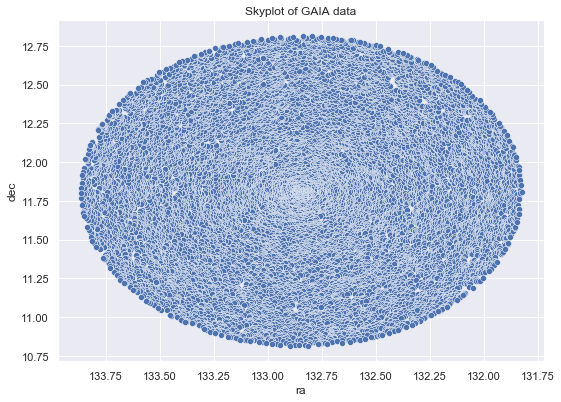

In [8]:
## plotting the skyplot 

sns.set(rc={'figure.figsize':(8.7,6.27)})

skyplot = sns.scatterplot(x='ra', y='dec', data = all_stars)
skyplot.invert_xaxis()
plt.title('Skyplot of GAIA data')
plt.show()

### Applying Filter:

#### Remove Noisy Data

In [9]:
## calculate magnitude error
all_stars['g_mag_error'] = 2.5/np.log(10) / all_stars.phot_g_mean_flux_over_error

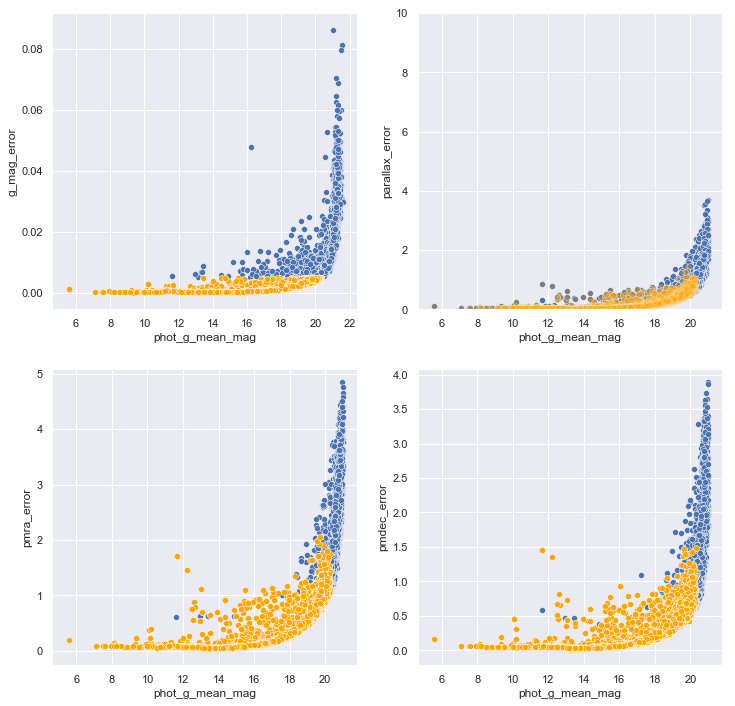

In [10]:
## Remove data with large noise 
mask = all_stars.g_mag_error < 0.005

plt.figure(figsize = (12,12))
plt.subplot(221)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.g_mag_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].g_mag_error, color = 'orange')

plt.subplot(222)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.parallax_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].parallax_error, color = 'orange', alpha = 0.25)
plt.ylim(0,10)


plt.subplot(223)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmra_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmra_error, color = 'orange')

plt.subplot(224)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmdec_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmdec_error, color = 'orange')
plt.show()

In [11]:
## Retrived percentage
len(all_stars[mask])/len(all_stars)

0.6366163826391391

In [12]:
# applying the filter
all_stars = all_stars.loc[mask, :]

In [13]:
# calculating the distance from the parallax
all_stars['distance_pc'] = 1/(all_stars.parallax*0.001)

In [14]:
print(len(all_stars))

# positive parallax
all_stars = all_stars[all_stars['parallax'] >= 0]
print(len(all_stars))

# dropping rows with null values in required columns
all_stars = all_stars[all_stars.loc[:, 'pmra'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'parallax'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'bp_rp'].notnull()]
print(len(all_stars))

# defining proper motion (pm) range
all_stars = all_stars[(abs(all_stars['pmra']) < 20) & (abs(all_stars['pmdec']) < 20)]
print(len(all_stars))

# taking stars within 60' = 1 deg radius
all_stars = all_stars[all_stars['dist'] < (60/60)]
print(len(all_stars))



12365
11384
11318
10347
10347


### Selecting cutoff to build GMM Model

In [15]:
class Run_GMM_Model():
    '''
    This class runs GMM model to the selected part of the datset, predicts the member and field star
    group, calculates the evaluation metric and visualizes the results
    
    Attribute:
    ----------
    data:           Full dataset of stars (after applying noise filter)
    working_data:   Filtered dataset by a given half-width value. 
                    We will run GMM model in this filtered dataset
                    
    (The following attribute is used to determine the working_data)
    distance_lit:   Distance of the cluster from the literature 
    
    feature_colums: The list of columns used as the features of GMM model
    gmm:            The GMM model applied on working data
    member:         The predicted member stars by GMM model in working data
    non_member:     The predicted field stars by GMM model in working data
    mss_metric:     Modified Silhouttee Score (MSS) for the current member and non_member group
    '''
    
    def __init__(self, data, distance):
        '''
        Initializes the class with a dataset.
        
        Input: 
        -------
        data:       Full dataset of stars
        distance:   Distance of the cluster from the literature 
        '''
        self.data = data
        self.distance_lit = distance
        
    def get_working_data(self, half_width):
        '''
        Returns the filtered subset of the datset based on the given half-width
        
        Input:
        ------
        half_width: The half-width for the distance cutoff
        '''
        filter = abs(self.data.distance_pc - self.distance_lit) < half_width
        working_data = self.data.loc[filter, :]
        return working_data
    
    def get_member(self, half_width, feature_columns, cutoff = 0.6, random_state = None):
        '''
        Classifies the working data into member and non_member groups.
        
        Inputs:
        -------
        half_width:     The half-width for the distance cutoff
        feature_colums: The list of columns used as the features of GMM model
        cutoff:         Threshold used for member cutoff. Default is 0.6.
                        If cutoff is 0.6, stars with membership probability >= 0.6 are members
                        and the stars with membership probability <= 0.4 (1-0.6) are non-members
        random_state:   Random State of the GMM algorithm. Used for reproducibility.
                        If 'None', then each time a new random seed will be used. Default is None.
                        
        GMM clusters the data into two groups. The group which has smaller average standard deviation 
        (thus more compact) is defined as the member group.
        '''
        self.feature_columns = feature_columns
        self.working_data = self.get_working_data(half_width)
        
        features = self.working_data.loc[:,feature_columns].dropna()

        # if there is less than 2 stars, GMM cannot divide them in two groups
        if len(self.working_data) < 2:
            raise ValueError('Less than two stars in the data')

        # normalizing the features
        scaled_features = pd.DataFrame({})
        for column in features.columns:
            scaled_features[column] = (features[column] - np.median(features[column]))/np.std(features[column])

        # Running GMM model: n_init = Number of Different Initialization tried by GMM
        gmm = GaussianMixture(n_components=2, n_init = 5, random_state = random_state)
        gmm.fit(scaled_features)

        #predictions from gmm
        labels = gmm.predict(scaled_features)       # group no (0 or 1)
        probs = gmm.predict_proba(scaled_features)  # membership probability
        
        # first assuming the group 1 is the member group
        self.working_data.loc[:, 'PMemb'] = probs[:, 1]  # membership probability to be in group 1
        self.working_data.loc[:, 'gmm_label'] = labels

        # select member and non-member based on member threshold
        non_member_ind = self.working_data.loc[:, 'PMemb'] <= (1-cutoff)
        non_member = self.working_data.loc[non_member_ind, :]

        member_ind = self.working_data.loc[:, 'PMemb'] >= cutoff
        member = self.working_data.loc[member_ind, :]

        # check if the average standard deviation of member group is larger.
        # if yes, then change the member group and assign group 0 as the member group. 
        if member[feature_columns].std().mean() > non_member[feature_columns].std().mean():
            self.working_data.loc[:, 'PMemb'] = probs[:, 0] # membership probability to be in group 1
            self.working_data.loc[:, 'gmm_label'] = 1-labels

            # select member and non-member based on member threshold using new PMemb value
            non_member_ind = self.working_data.loc[:, 'PMemb'] <= (1-cutoff)
            non_member = self.working_data.loc[non_member_ind, :]

            member_ind = self.working_data.loc[:, 'PMemb'] >= cutoff
            member = self.working_data.loc[member_ind, :]

        # save the results as an attribute of the class
        self.member, self.non_member, self.gmm = member, non_member, gmm
    
    def get_MSS_metric(self, epsilon = 1e-7):
        '''
        Calculates modified silhouttee score (MSS) from the current member and non_member group.
        If any of the group has less than 2 member (thus SD = 0 or None), MSS value is 0.
        Otherwise, MSS is the average of (field_SD - member SD)/max(field_SD, member SD, epsilon) for all features.
        
        epsilon: a very small number to avoid dividing by 0, when both SD are 0. Default value 1e-7.
        '''
        if len(self.member) < 2 or len(self.non_member) < 2:
            return 0

        metric = np.zeros(len(self.feature_columns))
        for i in range(len(self.feature_columns)):
            feature_i = self.feature_columns[i]
            # (field_SD - member SD)/max(field_SD, member SD, epsilon) for each features
            metric[i] = (np.std(self.non_member[feature_i]) - np.std(self.member[feature_i])) \
                    / max(np.std(self.member[feature_i]), np.std(self.non_member[feature_i]), epsilon)
        
        self.mss_metric = metric.mean()
        return self.mss_metric
    
    def visualize_member(self, title = None):
        '''
        Visualizes the following four plots in a 2x2 (row x col) setup:
        1. Proper motion plot (pmra vs pmdec) for current member and non-member
        2. Parallax distribution for current member and non-member
        3. Color-Magnitude Diagram (CMD) for member group
        4. Color-Magnitude Diagram (CMD) for non-member group
        
        Input:
        -------
        title: An overall title of these set of figures
        '''
        plt.figure(figsize=(14,14))

        if title:
            plt.suptitle(title)

        plt.subplot(221)
        sns.scatterplot(data = self.non_member, x='pmra', y='pmdec', label = 'non_member', color = 'tab:blue')
        sns.scatterplot(data = self.member, x='pmra', y='pmdec', label = 'member', color = 'tab:red')
        plt.xlabel('pmra (mas/yr)')
        plt.ylabel('pmdec (mas/yr)')

        plt.subplot(222)
        sns.distplot(self.non_member.parallax, label = 'non_member', color = 'tab:blue', kde = True)
        sns.distplot(self.member.parallax, label = 'member', color = 'tab:red', kde = True)
        plt.xlabel('Parallax (mas)')
        plt.ylabel('Probability Density [$mas^{-1}$]')
        plt.legend()

        plt.subplot(223)
        sns.scatterplot(data = self.member, x='g_rp', y='phot_g_mean_mag', color = 'tab:red', label = 'member')
        plt.gca().invert_yaxis()
        plt.ylabel('G Magnitude')
        plt.xlabel('G - RP Color')

        plt.subplot(224)
        sns.scatterplot(data = self.non_member, x='g_rp', y='phot_g_mean_mag', color = 'tab:blue', label = 'non member')
        plt.gca().invert_yaxis()
        plt.ylabel('G Magnitude')
        plt.xlabel('G - RP Color')

        plt.show()

In [16]:
# range of half-widths
half_widths = np.linspace(5, 1000, 24).round(2)
half_widths

array([   5.  ,   48.26,   91.52,  134.78,  178.04,  221.3 ,  264.57,
        307.83,  351.09,  394.35,  437.61,  480.87,  524.13,  567.39,
        610.65,  653.91,  697.17,  740.43,  783.7 ,  826.96,  870.22,
        913.48,  956.74, 1000.  ])

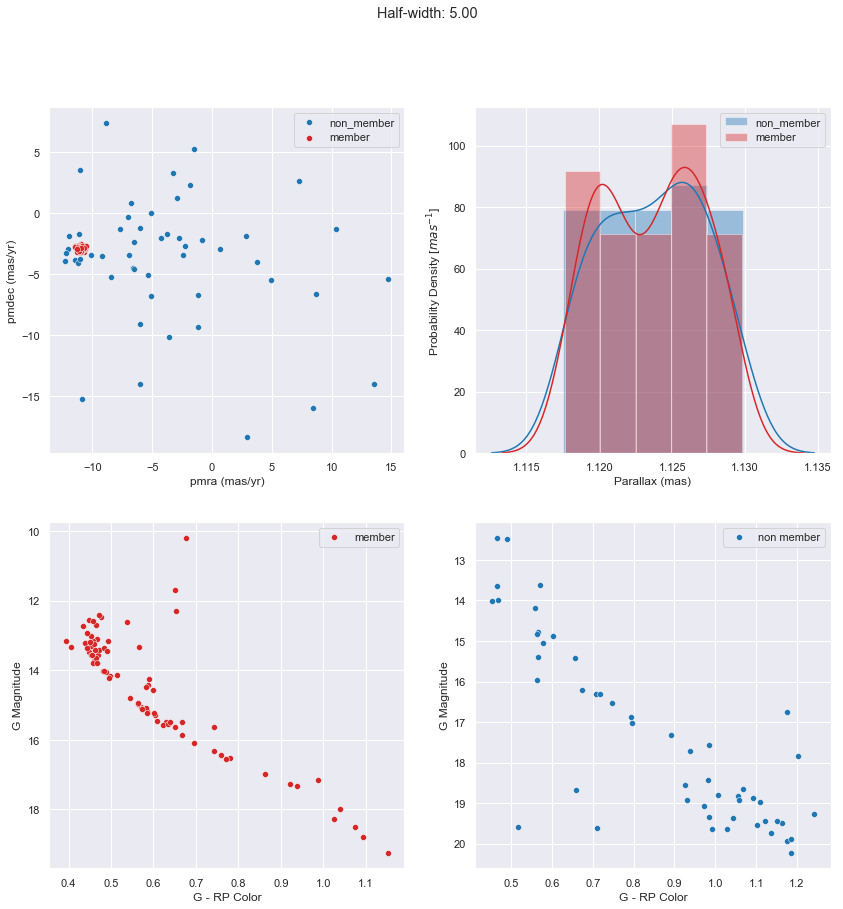

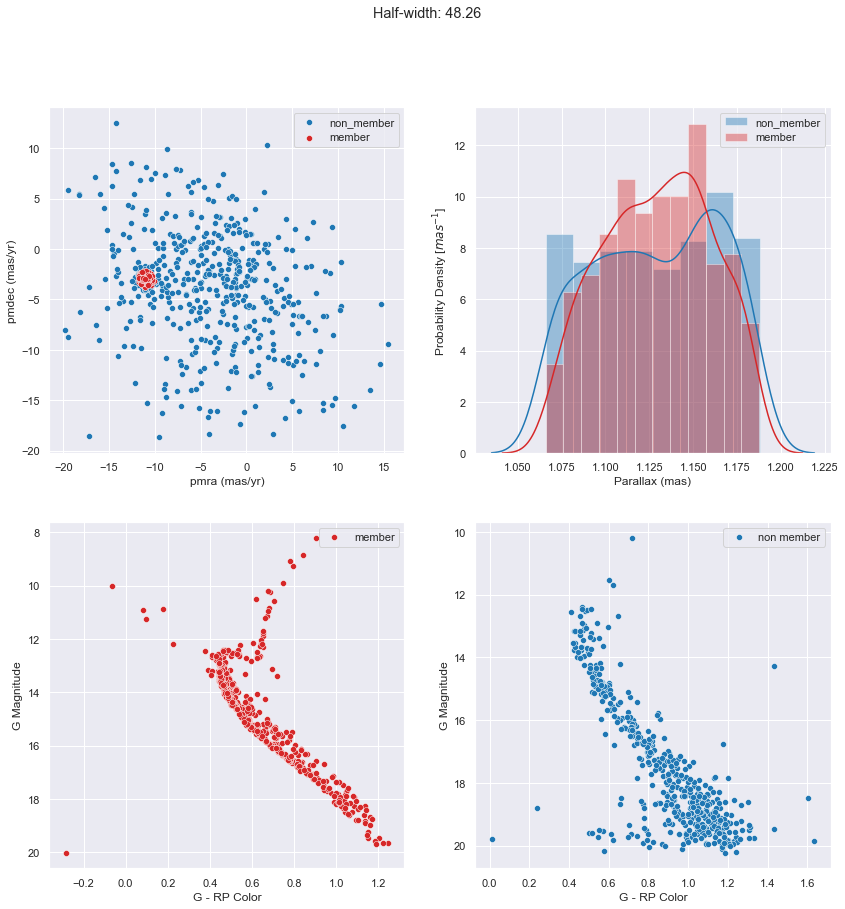

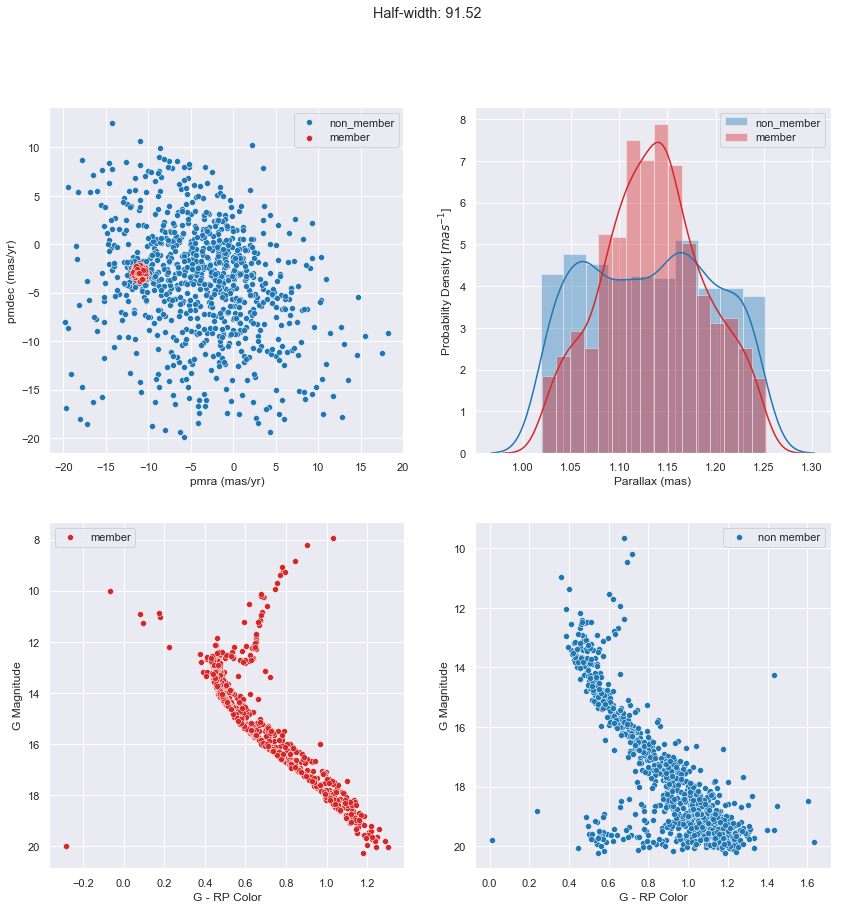

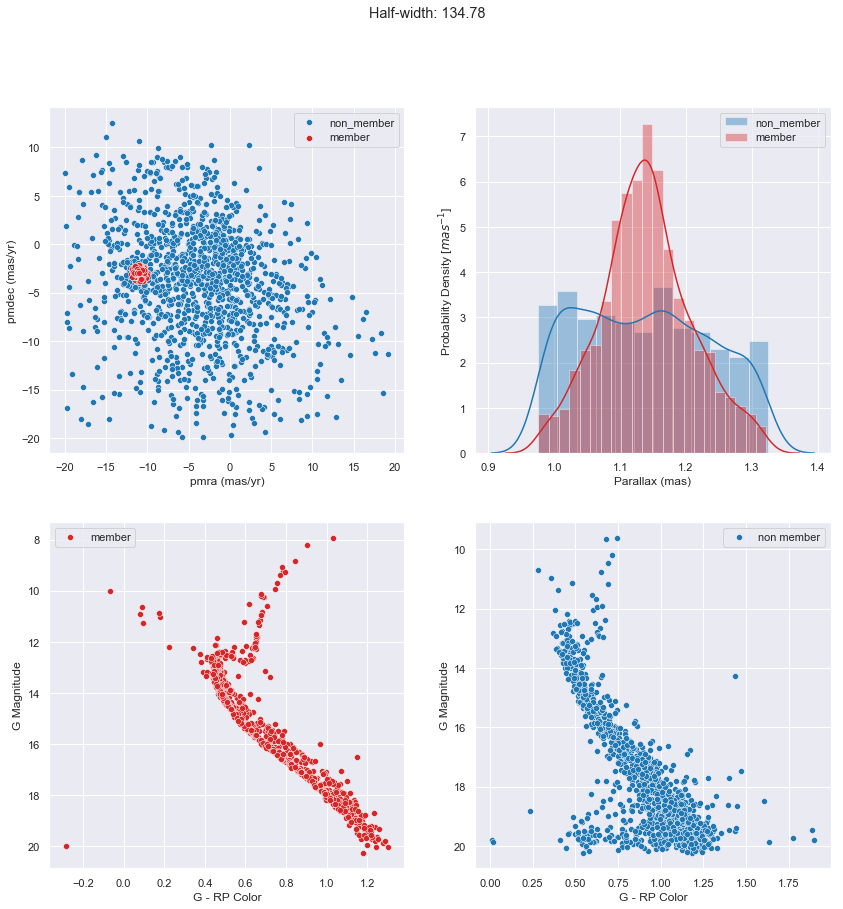

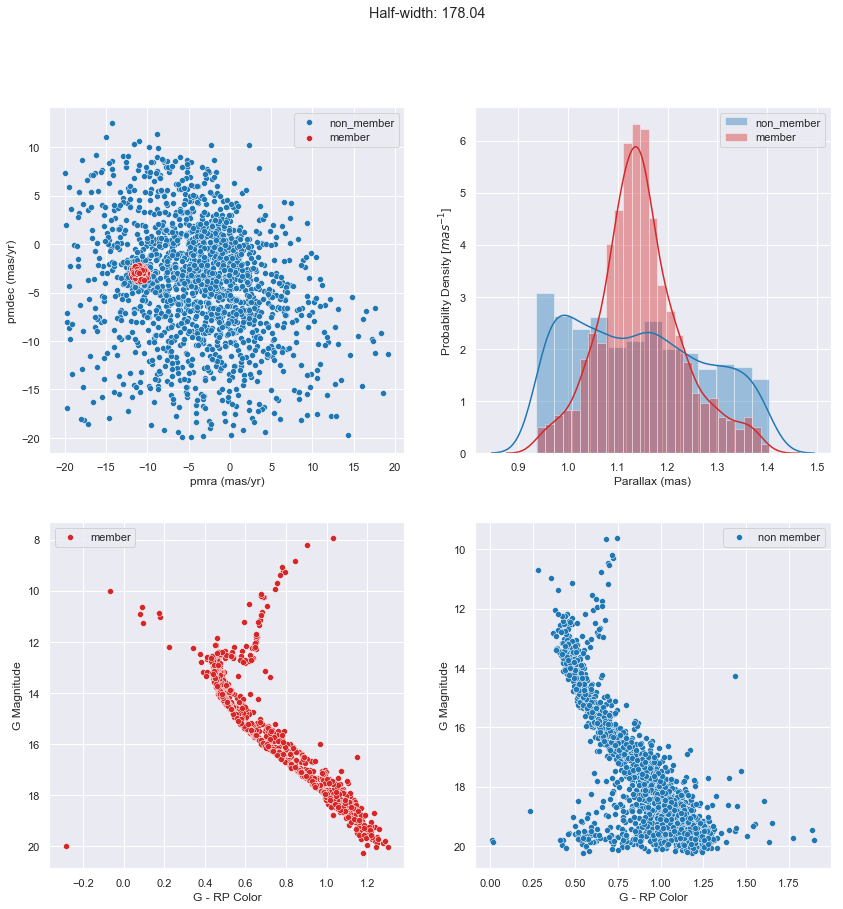

...

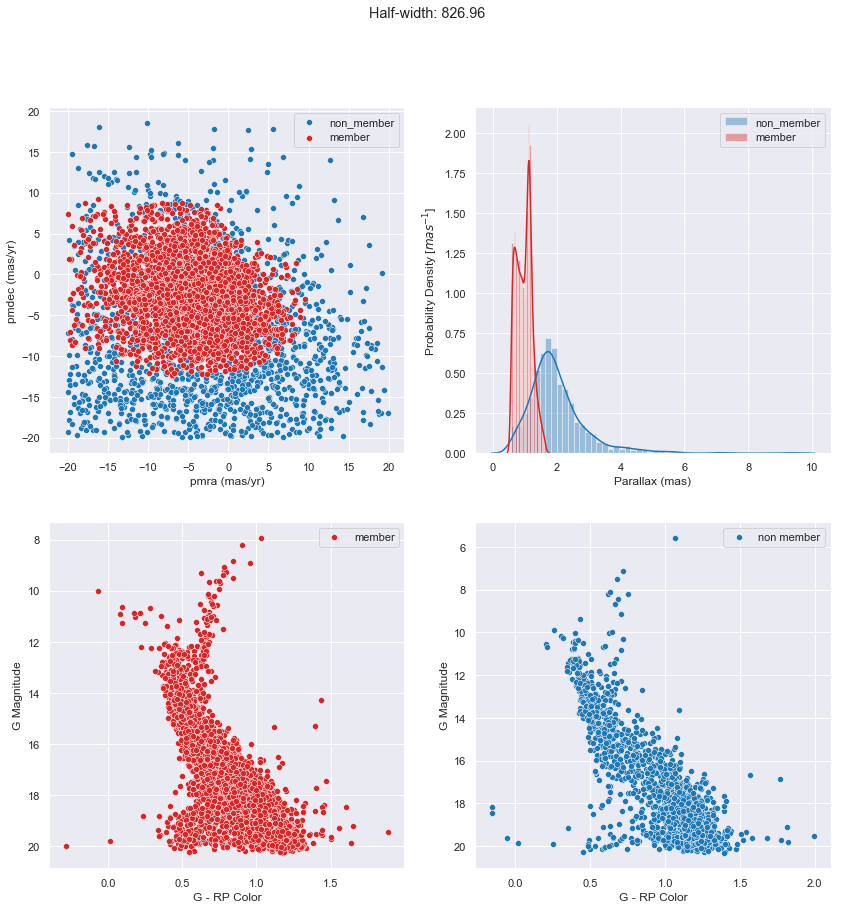

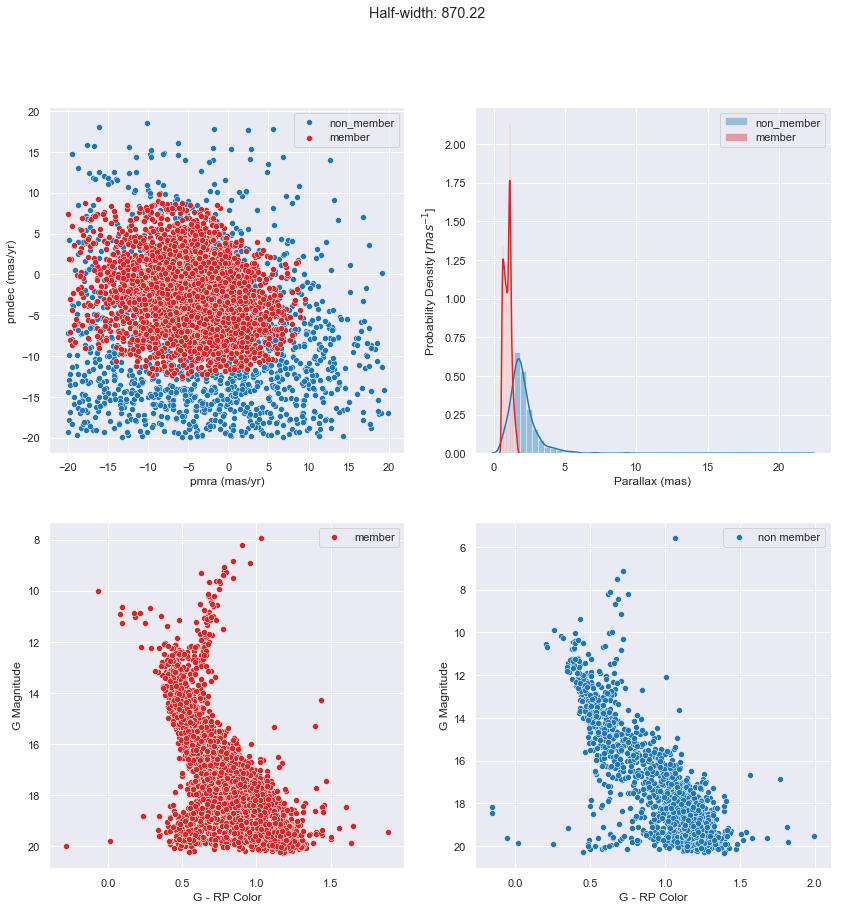

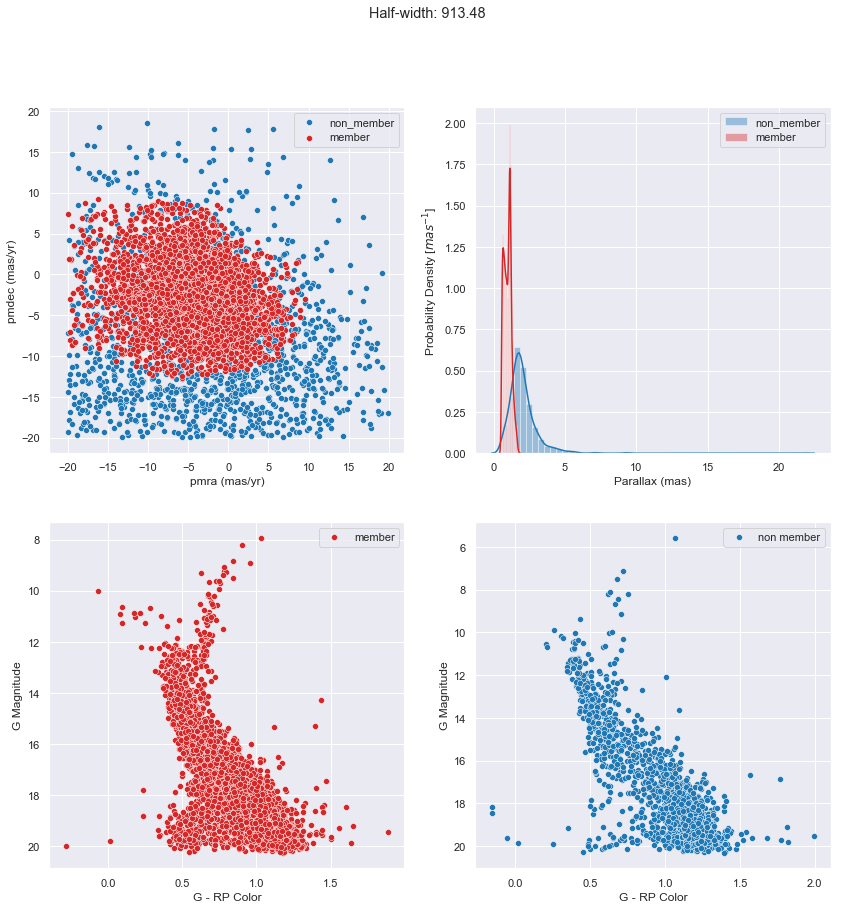

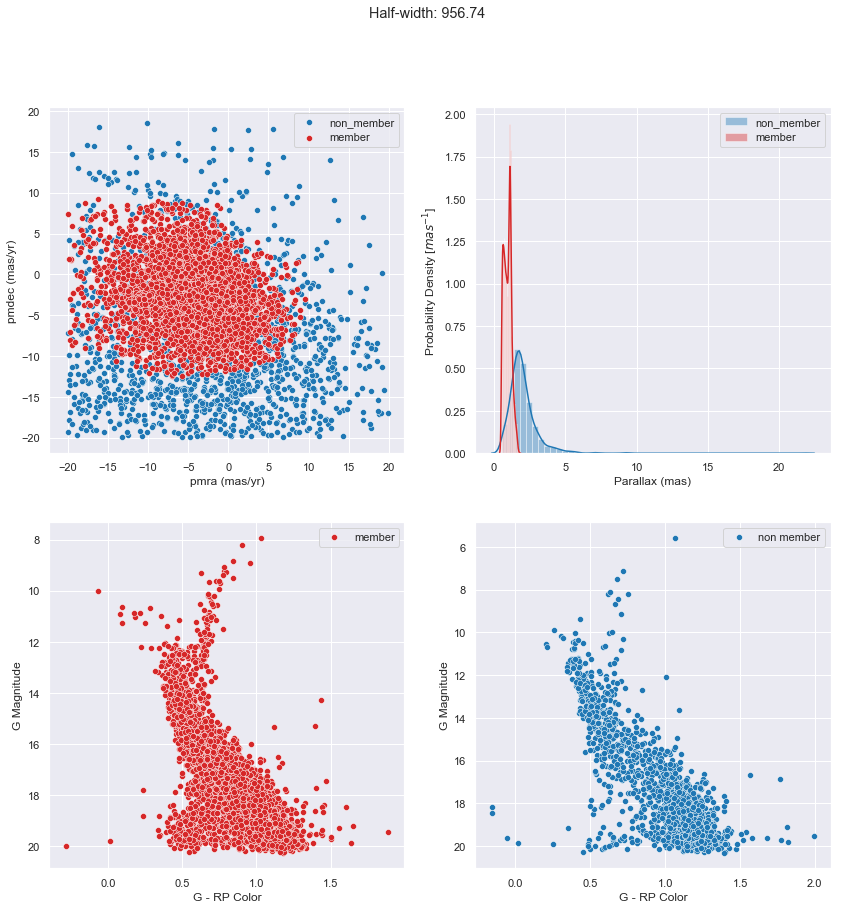

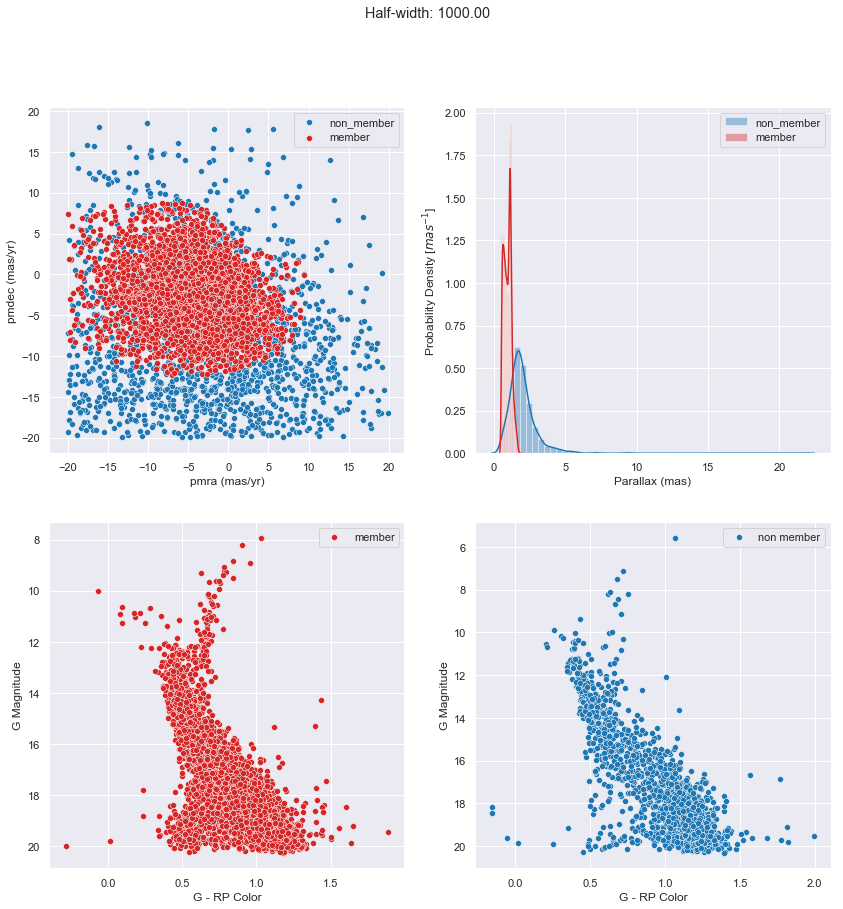

In [17]:
# distance of the cluster taken from Cantat-Gaudin (2020)
distance_lit = 890
gmm_model = Run_GMM_Model(all_stars, distance_lit)

metrics = np.full(len(half_widths), -1, dtype='float')
n_members = np.full(len(half_widths), -1, dtype='float')

n_trial = 15

for i in range(len(half_widths)):
    metric_value = 0
    n_member = 0

    # we will take the average MSS over all the trials for a given set of half-width and n_field
    for _ in range(n_trial):
        half_width = half_widths[i]
        
        feature_columns = ['pmra', 'pmdec', 'parallax']
        # get member and non_member
        # we want randomness in every trial, thus we kept random_state = None
        gmm_model.get_member(half_width, feature_columns = feature_columns)

        # number of star and metric calculation
        n_member += len(gmm_model.member)
        metric_value += gmm_model.get_MSS_metric()

    
    metrics[i] = metric_value/n_trial
    n_members[i] = n_member / n_trial
    gmm_model.visualize_member(title=f'Half-width: {half_width:0.2f}')

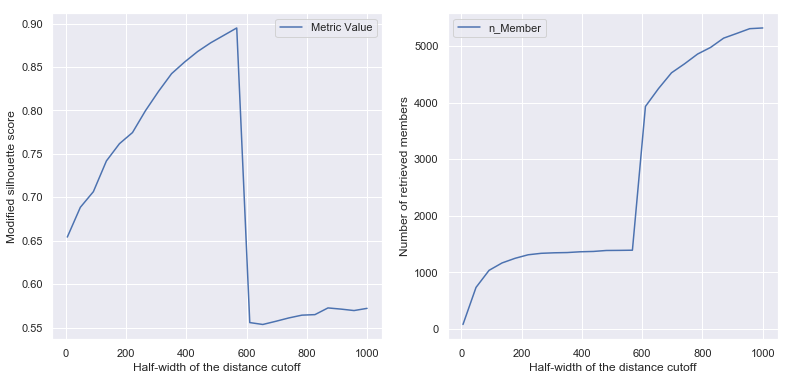

In [18]:
plt.figure(figsize = (13, 6))

plt.subplot(121)
sns.lineplot(half_widths, metrics, label = 'Metric Value')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Modified silhouette score')
plt.legend()

plt.subplot(122)
sns.lineplot(half_widths, n_members, label = 'n_Member')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Number of retrieved members')
plt.legend()
plt.show()

In [19]:
# best half-width is defined when we get maximum MSS
best_width = half_widths[np.nanargmax(metrics)]
best_width

567.39

#### Member Cutoff

In [20]:
gmm_model = Run_GMM_Model(all_stars, distance_lit)

cutoffs = np.linspace(0.5, 0.95, 10)
MSS_metrics = []
n_members = []

for cutoff in cutoffs:
    gmm_model.get_member(best_width, feature_columns, cutoff=cutoff)
    MSS = gmm_model.get_MSS_metric()
    
    MSS_metrics.append(MSS)
    n_members.append(len(gmm_model.member))

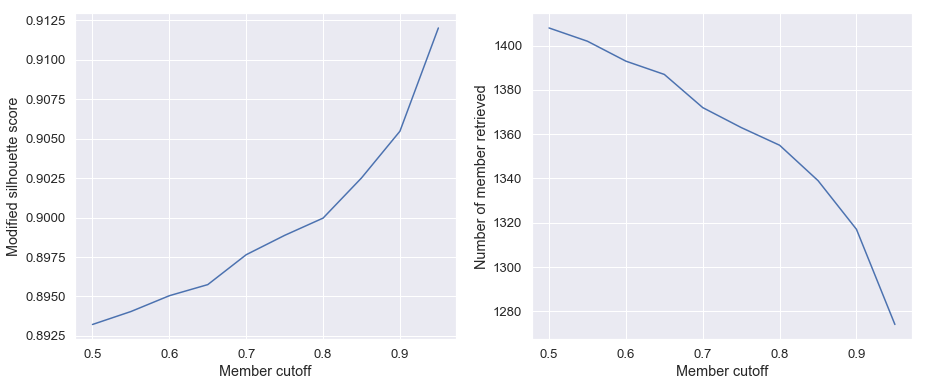

In [21]:
plt.figure(figsize = (15, 6))
sns.set(font_scale = 1.2)

plt.subplot(121)
sns.lineplot(cutoffs, MSS_metrics)
plt.xlabel('Member cutoff')
plt.ylabel('Modified silhouette score')

plt.subplot(122)
sns.lineplot(cutoffs, n_members)
plt.xlabel('Member cutoff')
plt.ylabel('Number of member retrieved')
plt.show()

In [22]:
# best cutoff is defined when we get maximum MSS
best_cutoff = cutoffs[np.nanargmax(MSS_metrics)]
best_cutoff

0.95

### Building GMM Model

number of member: 1274,
 number of field star: 4634,
 MSS: 0.91


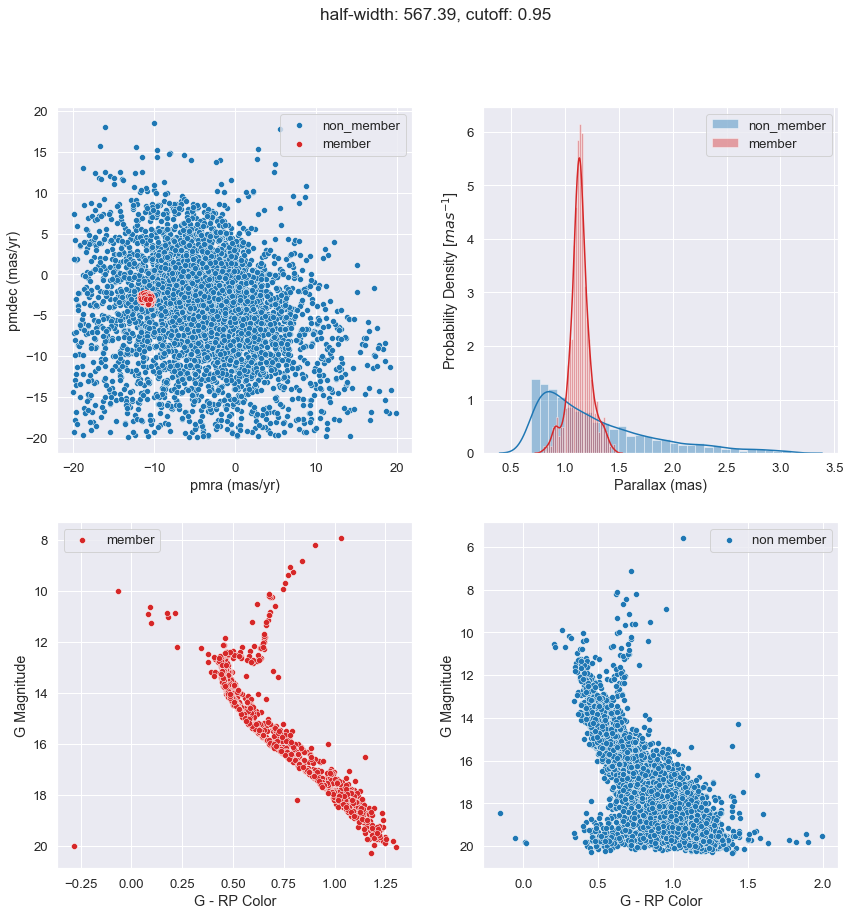

In [23]:
cutoff = best_cutoff
feature_columns = ['pmra', 'pmdec', 'parallax']

gmm_model.get_member(best_width, feature_columns, best_cutoff, random_state = 42)
MSS = gmm_model.get_MSS_metric()

print(f'number of member: {len(gmm_model.member)},\n number of field star: {len(gmm_model.non_member)},\n MSS: {MSS:0.2f}') 
gmm_model.visualize_member(title=f'half-width: {best_width}, cutoff: {cutoff}')

### Comparing with Gao Paper

In [112]:
member, non_member, gmm = gmm_model.member, gmm_model.non_member, gmm_model.gmm
all_stars_filtered = gmm_model.working_data

In [113]:
len(all_stars_filtered)

6118

#### Members and Covariance Matrix

Depending on the cutoff on PMemb, the number of stars are following:
* Likely member (PMemb >= 0.6) = 1401
* High-probability member (PMemb >= 0.95) = 1256
* Zero-probability field star (PMemb = 0) = 5720

And the covariance matrix for field stars group, $\sum_f$ and the member group $\sum_c$ are following:


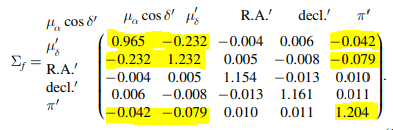

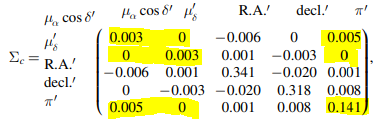

In [25]:
gmm.covariances_.round(3)

array([[[ 0.002, -0.   ,  0.003],
        [-0.   ,  0.003, -0.   ],
        [ 0.003, -0.   ,  0.067]],

       [[ 1.036, -0.23 , -0.115],
        [-0.23 ,  1.286, -0.147],
        [-0.115, -0.147,  1.254]]])

In [26]:
print('Number of sample stars:', len(all_stars_filtered))

Number of sample stars: 6118


In [27]:
print('n(PMemb >= 0.6) =', sum(all_stars_filtered.PMemb >= 0.6))
print('n(PMemb >= 0.95) =', sum(all_stars_filtered.PMemb >= 0.95))
print('n(PMemb <= 0.0001) =', sum(all_stars_filtered.PMemb <= 0.0001))

n(PMemb >= 0.6) = 1394
n(PMemb >= 0.95) = 1274
n(PMemb <= 0.0001) = 4558


#### Figure 1
PMemb histogram and the plot for PMemb vs G band magnitude.

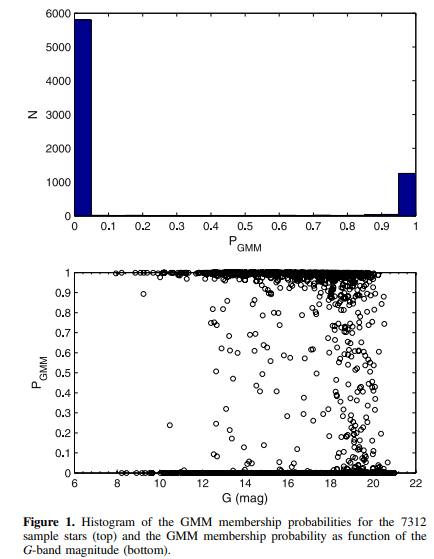


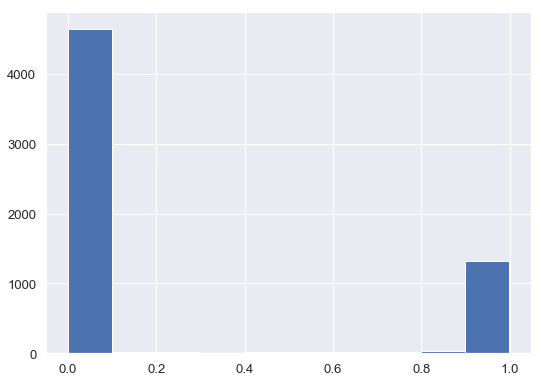

In [28]:
plt.hist(all_stars_filtered.PMemb)
plt.show()

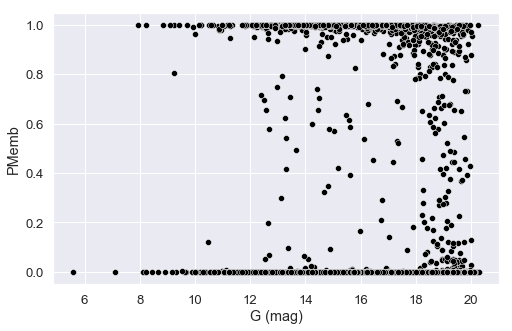

In [29]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = all_stars_filtered, color = 'black')
plt.xlabel('G (mag)')
plt.show()

#### Figure 2
Proper Motion Plot

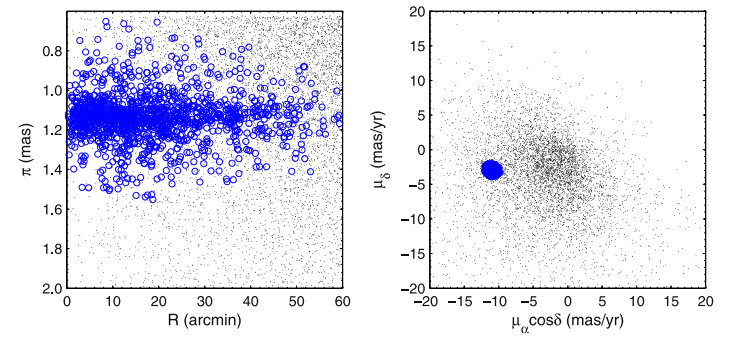

In [30]:
# concatanate both member and field star
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,DESIGNATION,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,0.998999,1,1
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,0.998589,1,1
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,0.998815,1,1
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,0.996445,1,1
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,0.999011,1,1


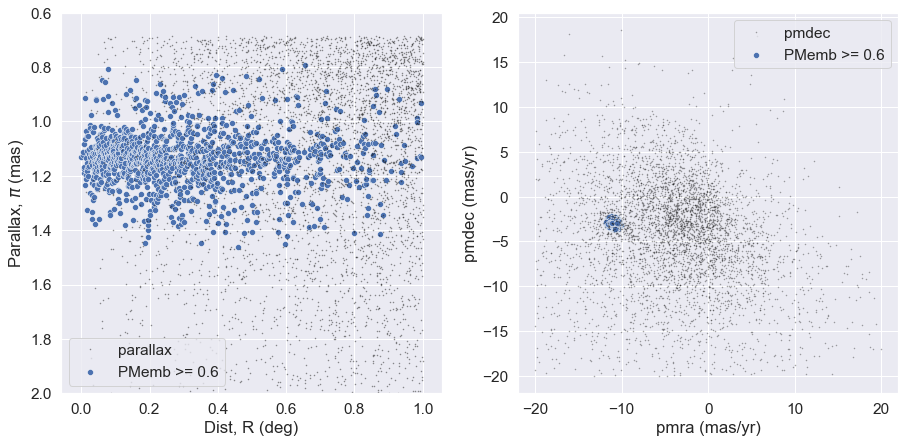

In [31]:
sns.set(font_scale = 1.4)

plt.figure(figsize = (15,7))

plt.subplot(121)
plt.plot(non_member['dist'], non_member['parallax'], 'k.',  alpha = 0.5,
         markersize = 1)
plt.gca().invert_yaxis()
sns.scatterplot('dist', 'parallax', data = member, label = 'PMemb >= 0.6')
plt.xlabel('Dist, R (deg)')
plt.ylabel('Parallax, $\pi$ (mas)')
plt.legend()
plt.ylim(2,0.6)

plt.subplot(122)
plt.plot(non_member['pmra'], non_member['pmdec'], 'k.', alpha = 0.4, 
         markersize = 1)
sns.scatterplot('pmra', 'pmdec', data = member, label = 'PMemb >= 0.6')
plt.ylabel('pmdec (mas/yr)')
plt.xlabel('pmra (mas/yr)')
plt.legend()
plt.show()

#### Figure 3: CMD
Color-Magnitude Diagram

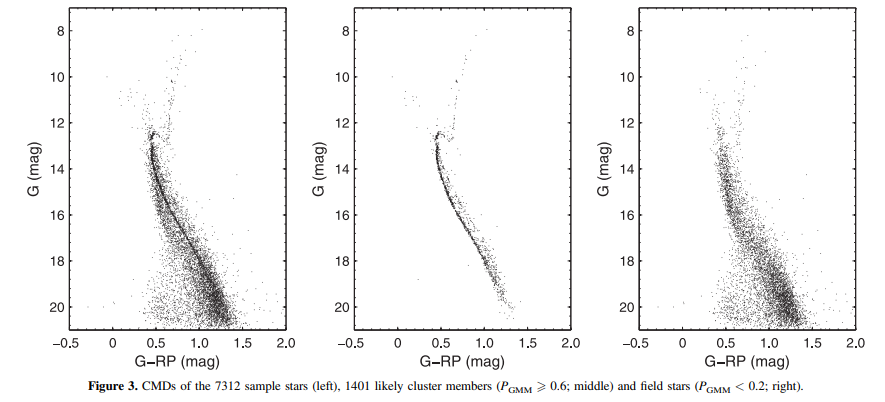

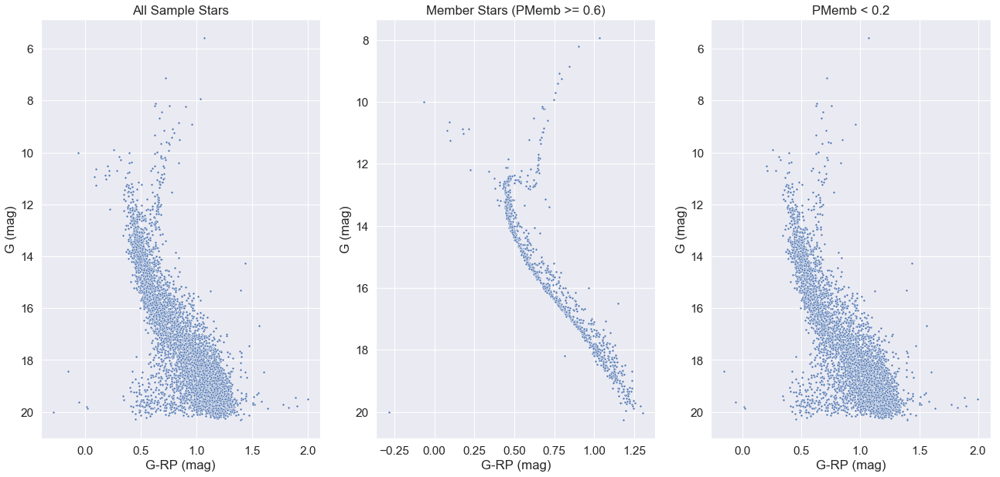

In [32]:
fig, axes = plt.subplots(1, 3, figsize=(22,10))
#fig.suptitle('CMD of Training data for M67')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = training_data, ax = axes[0], marker = '.')
axes[0].set_title('All Sample Stars')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = '.',
                data = member, ax = axes[1])
axes[1].set_title('Member Stars (PMemb >= 0.6)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',  marker = '.',
                data = non_member[non_member.PMemb < 0.2], ax = axes[2])
axes[2].set_title('PMemb < 0.2')
axes[2].invert_yaxis()
axes[2].set_xlabel('G-RP (mag)')
axes[2].set_ylabel('G (mag)')

plt.show()


#### Distribution of features

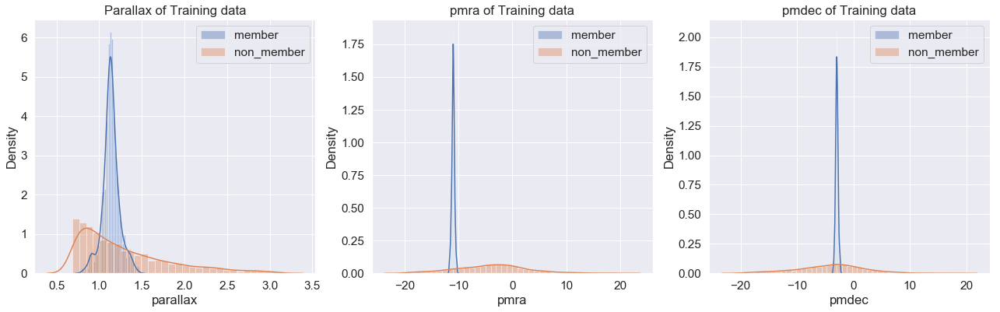

In [33]:
plt.figure(figsize = (22,6))

plt.subplot(131)
sns.distplot(member.parallax, label='member')
sns.distplot(non_member.parallax, label = 'non_member')
plt.title('Parallax of Training data')
plt.legend()

plt.subplot(132)
sns.distplot(member.pmra, label='member')
sns.distplot(non_member.pmra, label = 'non_member')
plt.title('pmra of Training data')
plt.legend()

plt.subplot(133)
sns.distplot(member.pmdec, label='member')
sns.distplot(non_member.pmdec, label = 'non_member')
plt.title('pmdec of Training data')
plt.legend()

plt.show()

## Replication: Random Forest

Here we used the training data retrieved from GMM model to train a random forest model. Then predicted the cluster membership for a larger radius (2.5 degree) around the cluster center.

### Training Data

In [34]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,DESIGNATION,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,0.998999,1,1
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,0.998589,1,1
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,0.998815,1,1
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,0.996445,1,1
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,0.999011,1,1


In [35]:
# Examining the descriptive statistics of each column
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
count,5.908000e+03,5.908000e+03,5.908000e+03,5908.0,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,...,2438.000000,2438.000000,2438.000000,2438.000000,5908.000000,5908.000000,5908.000000,5.908000e+03,5908.00000,5908.00000
mean,1.635721e+18,6.035633e+17,8.524138e+08,2015.5,132.845529,0.180714,11.816036,0.117774,1.255465,0.230917,...,1.534381,4.117613,3.856173,4.379052,0.589843,0.001625,891.042300,2.147582e-01,0.21564,0.21564
std,0.000000e+00,3.003749e+15,4.871041e+08,0.0,0.467470,0.163197,0.464623,0.107163,0.475097,0.209728,...,3.196324,33.647640,31.751328,35.547482,0.277967,0.001403,271.941737,4.092130e-01,0.41130,0.41130
min,1.635721e+18,5.986153e+17,2.657300e+04,2015.5,131.835038,0.017678,10.818079,0.011441,0.686520,0.020817,...,0.512218,0.039763,0.036985,0.042542,0.000629,0.000125,323.188590,0.000000e+00,0.00000,0.00000
25%,1.635721e+18,5.989720e+17,4.401983e+08,2015.5,132.505363,0.040693,11.480663,0.027077,0.925427,0.051924,...,0.797990,0.281840,0.240828,0.320161,0.361382,0.000413,705.964242,0.000000e+00,0.00000,0.00000
50%,1.635721e+18,6.049053e+17,8.566396e+08,2015.5,132.846325,0.119041,11.814219,0.077145,1.136086,0.151709,...,1.003411,0.650595,0.584875,0.712966,0.632703,0.001106,880.214831,3.083758e-168,0.00000,0.00000
75%,1.635721e+18,6.049894e+17,1.275009e+09,2015.5,133.179124,0.288100,12.148327,0.187951,1.416502,0.370288,...,1.406636,1.955238,1.794149,2.098127,0.833247,0.002631,1080.582097,4.857197e-13,0.00000,0.00000
max,1.635721e+18,6.081334e+17,1.692558e+09,2015.5,133.857522,0.914358,12.807801,0.641737,3.094169,1.310992,...,88.923782,1196.576782,1135.376587,1257.776978,0.999960,0.004999,1456.621578,9.991386e-01,1.00000,1.00000


In [65]:
# Choosing the features

feature_columns = np.array(['pmra', 'pmdec',
                   'parallax', 'phot_g_mean_mag',
                   "phot_bp_mean_mag", 'phot_rp_mean_mag',
                   'bp_rp', 'bp_g', 'g_rp'])

features = training_data.loc[:,feature_columns]
targets = training_data['member']

In [37]:
# Dropping the NULL values from the using training set
# adding features and targets in a training set
training_set = pd.concat((features, targets), axis=1)

# dropping NA
training_set = training_set.dropna()

# finding where dtype is float64
float64_data = np.where(training_set.dtypes == 'float64')[0] 

# change the data type to float32 from float64
training_set.iloc[:, float64_data] = training_set.iloc[:, float64_data].astype('float32')


# set features, targets again
features, targets = training_set.iloc[:,:-1], training_set.iloc[:,-1]

features.describe()

,pmra,pmdec,parallax,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,bp_rp,bp_g,g_rp
count,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000
mean,-5.390935,-3.837091,1.255466,17.071323,17.802046,16.217531,1.584483,0.730692,0.853797
std,6.606390,5.404550,0.475097,2.321504,2.559148,2.110794,0.589291,0.333574,0.272666
min,-19.999044,-19.973394,0.686520,5.592662,6.941972,4.524381,-0.521719,-0.564203,-0.284916
25%,-10.913007,-6.509486,0.925427,15.381892,15.848603,14.753986,1.044285,0.431197,0.606216
50%,-5.856175,-3.040318,1.136086,17.611234,18.476658,16.677201,1.599471,0.712745,0.869264
75%,-0.948598,-1.331468,1.416502,19.062657,20.008962,17.978319,2.088179,0.990410,1.092491
max,19.932800,18.545561,3.094169,20.294615,21.550045,20.294409,2.994736,1.707638,1.996153


In [38]:
targets.value_counts()

0    4634
1    1274
Name: member, dtype: int64

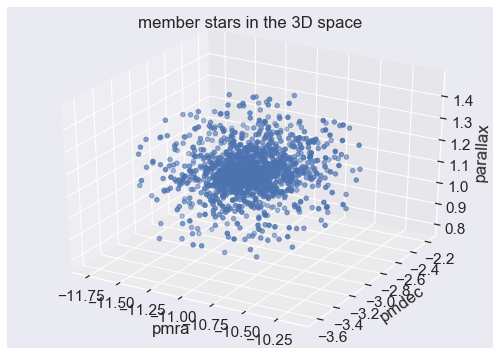

In [39]:
from mpl_toolkits.mplot3d import Axes3D

ax = plt.figure().gca(projection='3d')

ax.scatter(member.pmra, member.pmdec, member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('member stars in the 3D space')
plt.show()


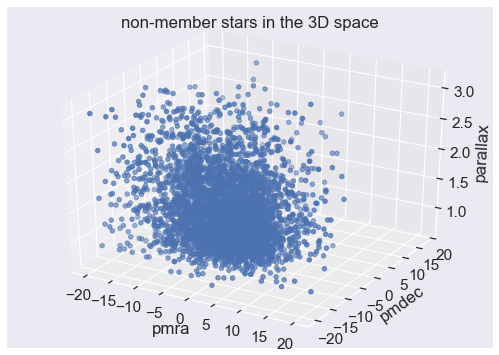

In [40]:
ax = plt.figure().gca(projection='3d')

ax.scatter(non_member.pmra, non_member.pmdec, non_member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('non-member stars in the 3D space')
plt.show()


### Feature Importance

#### Mean Decrease in Impurity (MDI)

In [41]:
# Use Random Forest on whole dataset using 1000 different trees 
rfc = RandomForestClassifier(n_estimators = 1000, oob_score = True)
rfc.fit(features, targets)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [42]:
# checking the feature importance, 
# ( this is higher for a variable if the model efficiency become lower as we remove that variable)
feature_imp = pd.Series(rfc.feature_importances_, index=features.columns).sort_values(ascending = False)
feature_imp

pmra                0.522914
pmdec               0.264822
parallax            0.103104
phot_rp_mean_mag    0.036323
phot_g_mean_mag     0.024922
phot_bp_mean_mag    0.018395
g_rp                0.013833
bp_rp               0.008153
bp_g                0.007534
dtype: float64

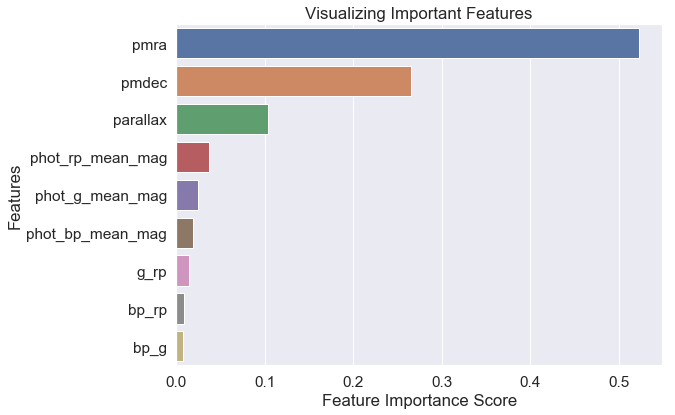

In [43]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

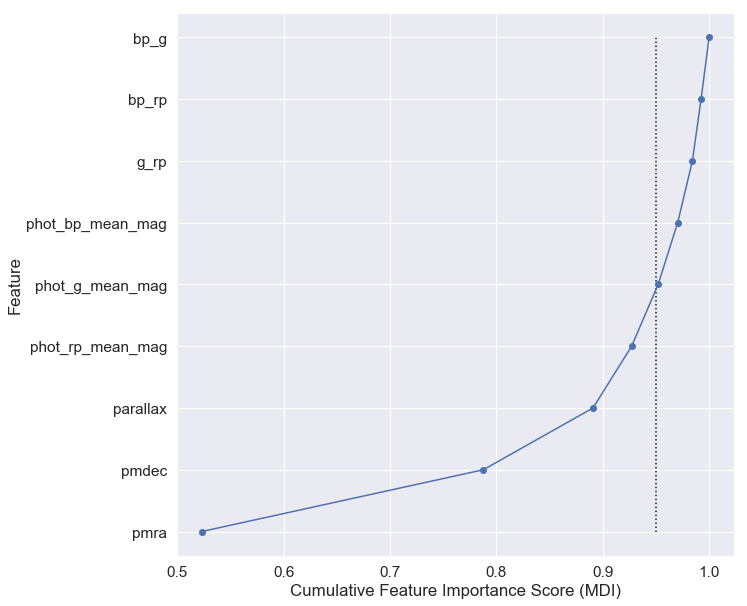

In [44]:
# derive and plot the cumulative importance
cumulative = np.cumsum(feature_imp)

plt.figure(figsize=(10,10))
plt.plot(cumulative, feature_imp.index, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score (MDI)')
plt.show()

In [45]:
# we will select only those features that are needed
# to cross a 95% cumulative importance
max_index = np.where(cumulative > 0.95)[0][0]
max_index

4

In [46]:
# chosen features
imp_feature_columns = feature_imp.index[:max_index+1]
imp_feature_columns

Index(['pmra', 'pmdec', 'parallax', 'phot_rp_mean_mag', 'phot_g_mean_mag'], dtype='object')

#### SHAP feature importance

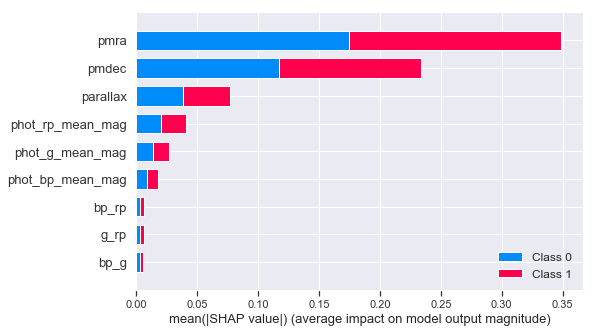

In [47]:
import shap
rfc.fit(features, targets)

shap_values = shap.TreeExplainer(rfc).shap_values(features)
shap.summary_plot(shap_values, features)

In [49]:
shap_values = np.array(shap_values)

# mean of absolute SHAP values for class 1 (member)
feature_imp_member = abs(shap_values[1,:,:]).mean(axis=0)
# mean of absolute SHAP values for class 0 (non_member)
feature_imp_non_member = abs(shap_values[1,:,:]).mean(axis=0)

In [50]:
# overall feature imp
feature_imp = feature_imp_member+feature_imp_non_member
#normalizing
feature_imp /= feature_imp.sum()

In [59]:
# sorting shap feature importance in descending order
sorted_order = feature_imp.argsort()[::-1]
sorted_feature_imp = feature_imp[sorted_order]

In [66]:
sorted_feature_columns = feature_columns[sorted_order]

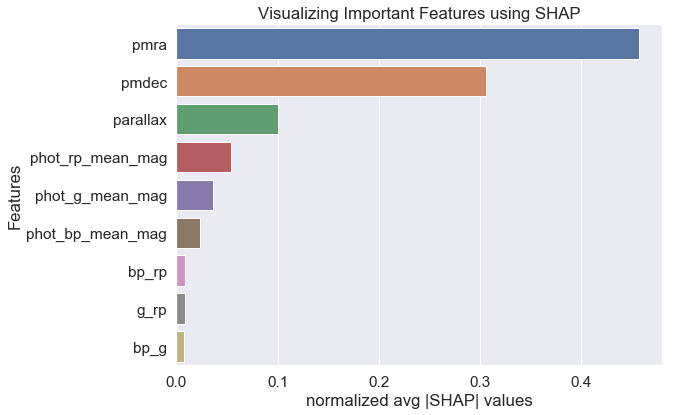

In [67]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=sorted_feature_imp, 
            y=sorted_feature_columns)
# Add labels to the graph
plt.xlabel('normalized avg |SHAP| values')
plt.ylabel('Features')
plt.title("Visualizing Important Features using SHAP")
plt.show()

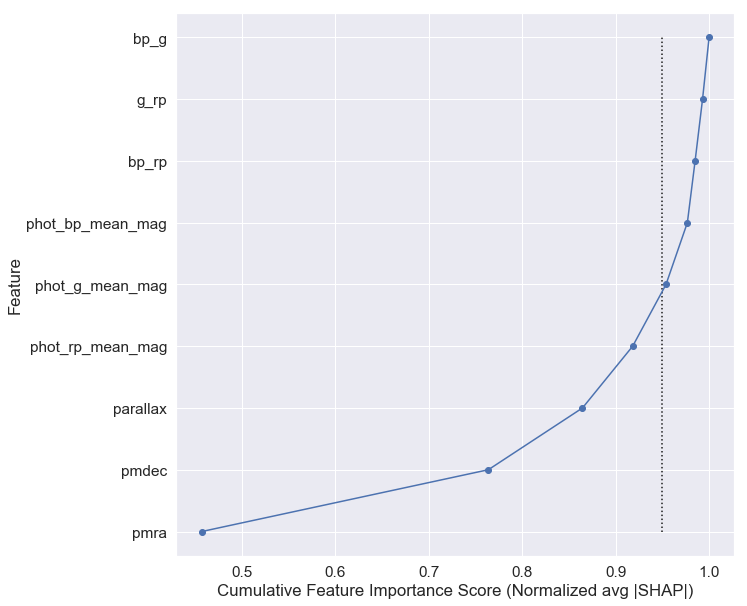

In [68]:
# calculate and plot the cumulative
cumulative = np.cumsum(sorted_feature_imp)

plt.figure(figsize=(10,10))
plt.plot(cumulative, sorted_feature_columns, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score (Normalized avg |SHAP|)')
plt.show()

In [69]:
# we will select only those features that are needed
# to cross a 95% cumulative importance
max_index = np.where(cumulative > 0.95)[0][0]
max_index

4

In [70]:
# chosen features
imp_feature_columns = sorted_feature_columns[:max_index+1]
imp_feature_columns 

array(['pmra', 'pmdec', 'parallax', 'phot_rp_mean_mag', 'phot_g_mean_mag'],
      dtype='<U16')

### Model Selection and Accuracy Estimate using Test Data

In [71]:
features = training_data.loc[:, imp_feature_columns]
targets = training_data['member']

features.head()

,pmra,pmdec,parallax,phot_rp_mean_mag,phot_g_mean_mag
0,-10.956961,-3.093306,1.129222,12.113283,12.562178
2,-11.261058,-3.060736,1.113444,15.248243,15.941956
3,-10.902709,-3.153121,1.125087,12.773678,13.167254
4,-10.978362,-3.395680,1.111626,13.436893,14.060972
5,-10.941340,-2.921289,1.189351,14.436324,15.012680


In [72]:
from sklearn.model_selection import train_test_split
# splitting our dataset using 0.3 test ratio (30% test data, 70% train data)
train_features, test_features, train_targets, test_targets = train_test_split(features,
                                                                              targets,
                                                                              test_size = 0.3, 
                                                                              stratify = targets,
                                                                              random_state=258)

In [73]:
# checking if the splited data have similar percentage of member and non-member

print(f'Propostion of class:\n \
 original target data:\n{targets.value_counts()/len(targets)} \n\
 test_targets: \n{test_targets.value_counts()/len(test_targets)} \n\
 train_targets: \n{train_targets.value_counts()/len(train_targets)}')

Propostion of class:
  original target data:
0    0.78436
1    0.21564
Name: member, dtype: float64 
 test_targets: 
0    0.784546
1    0.215454
Name: member, dtype: float64 
 train_targets: 
0    0.784281
1    0.215719
Name: member, dtype: float64


In [74]:
def evaluate_model(model, train_features = train_features, test_features = test_features, 
                   train_targets = train_targets, test_targets = test_targets):
    '''
    Returns the precision of the given model in both train and test subset, accuracy in test
    subset along with the confusion matrix showing how many stars are predicted right or wrong
    
    input:
    ------
    model:          A fitted supervised model
    train_features: Features of training subset
    train_labels:   Labels of training subset
    test_features:  Features of test subset
    test_labels:    Labels of test subset
    '''
    test_predict = model.predict(test_features)
    train_predict = model.predict(train_features)

    print('Model Accuracy:')
    print("Precision on training data: %.3f" % precision_score(train_targets, train_predict))
    print("Precision on testing data: %.3f" % precision_score(test_targets, test_predict))
    print('Accuracy on test data: %.3f' % accuracy_score(test_targets, test_predict))


    sns.heatmap(confusion_matrix(test_targets, test_predict), cmap= 'Greens', annot = True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

    print("Classification Report: \n", classification_report(test_targets, test_predict))

#### Random Forest Hyperparameter Tuning

We will optimize the parameteres of random forest model using cross-validation.

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


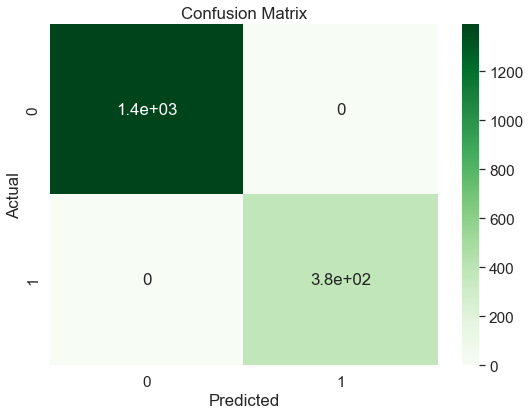

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [75]:
# first check the performance of the base model
base_model = RandomForestClassifier(n_estimators = 7000, 
                                    max_features = 4,
                                    random_state = 42,
                                    oob_score = True)
base_model.fit(train_features, train_targets)

evaluate_model(base_model)


In [76]:
n_estimators = [int(x) for x in np.linspace(start = 500, stop = 10000, num = 20)]
max_features = ['sqrt']+[i for i in range(1, len(features.columns)+1)]

# Maximum number of levels
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

random_grid

{'n_estimators': [500,
  1000,
  1500,
  2000,
  2500,
  3000,
  3500,
  4000,
  4500,
  5000,
  5500,
  6000,
  6500,
  7000,
  7500,
  8000,
  8500,
  9000,
  9500,
  10000],
 'max_features': ['sqrt', 1, 2, 3, 4, 5],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4]}

In [77]:
rfc = RandomForestClassifier(random_state = 42)

rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, 
                               n_iter = 100, cv = 5, verbose=10, random_state=42, n_jobs = -1,
                               scoring = 'precision')

In [78]:
rfc_random.fit(train_features, train_targets)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed: 22

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': [500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000], 'max_features': ['sqrt', 1, 2, 3, 4, 5], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', sc

In [79]:
rfc_random.best_params_

{'n_estimators': 5500,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 4,
 'max_depth': 70}

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


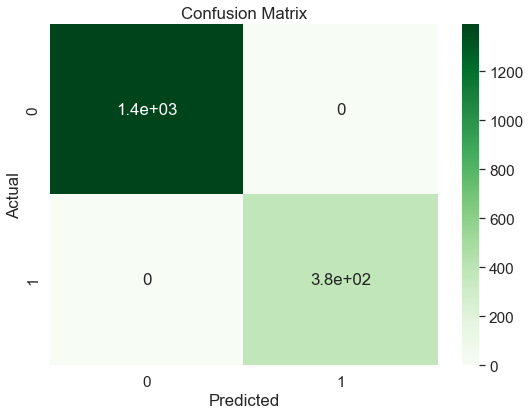

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [80]:
best_random = rfc_random.best_estimator_

evaluate_model(best_random)


### Prediction for the new stars

In [81]:
## chosing only GAIA stars close to 2.5 degree radius of the center

coordinate = coord.SkyCoord.from_name('M67')
print(coordinate)
radius = u.Quantity(2.5, u.deg)
Gaia.ROW_LIMIT = -1
# table = "gaiaedr3.gaia_source"
table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius)
r_large = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (132.846, 11.814)>
INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [82]:
GAIA_target_stars = r_large.to_pandas()

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars['parallax'] >= 0]

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars.loc[:, 'bp_rp'].notnull()]

GAIA_target_stars.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist
count,7.804600e+04,7.804600e+04,7.804600e+04,78046.0,78046.000000,78046.000000,78046.000000,78046.000000,78046.000000,78046.000000,...,16909.000000,16909.000000,16153.0,16153.000000,16153.000000,16153.000000,16153.000000,16153.000000,16153.000000,78046.000000
mean,1.635721e+18,6.031280e+17,8.486501e+08,2015.5,132.766178,0.350990,11.779598,0.234940,1.207054,0.435092,...,0.096957,0.267417,200111.0,1.468439,1.352576,1.562720,4.105049,3.643857,4.566270,1.631584
std,0.000000e+00,3.774319e+15,4.886120e+08,0.0,1.255810,0.369053,1.235089,0.252434,1.323583,0.453875,...,0.135192,0.212119,0.0,2.873177,2.673818,3.052781,31.228405,27.921249,34.625950,0.617686
min,1.635721e+18,5.972678e+17,2.351200e+04,2015.5,130.293414,0.016709,9.317264,0.010475,0.000025,0.019948,...,0.000000,0.007100,200111.0,0.500064,0.307305,0.512218,0.028188,0.024130,0.029386,0.000629
25%,1.635721e+18,5.987878e+17,4.263142e+08,2015.5,131.763355,0.080372,10.786445,0.053616,0.489355,0.101451,...,0.008400,0.116800,200111.0,0.742750,0.671721,0.785978,0.283620,0.240807,0.322379,1.197192
50%,1.635721e+18,6.038936e+17,8.496471e+08,2015.5,132.744243,0.216430,11.775999,0.144425,0.880778,0.274281,...,0.046000,0.209100,200111.0,0.958316,0.882538,1.015745,0.706546,0.612152,0.796286,1.743326
75%,1.635721e+18,6.054598e+17,1.272744e+09,2015.5,133.751778,0.504472,12.758739,0.329426,1.516213,0.621088,...,0.125400,0.349100,200111.0,1.317834,1.205381,1.424014,1.877290,1.640333,2.099494,2.153988
max,1.635721e+18,6.092614e+17,1.692917e+09,2015.5,135.398937,3.119140,14.311609,2.653485,85.552801,4.168016,...,1.180900,1.490100,200111.0,90.470146,80.827682,98.599403,1537.619263,1312.932617,1762.305908,2.499963


In [83]:
# noise filter
GAIA_target_stars['g_mag_error'] = 2.5/np.log(10) / GAIA_target_stars.phot_g_mean_flux_over_error
mask = GAIA_target_stars.g_mag_error < 0.005

# distance filter
GAIA_target_stars['distance_pc'] = 1/(GAIA_target_stars.parallax*0.001)
dist_filter = abs(GAIA_target_stars.distance_pc - distance_lit) < best_width

# proper motion filter
pm_filter = (abs(GAIA_target_stars['pmra']) < 20) & (abs(GAIA_target_stars['pmdec']) < 20)

GAIA_target_stars = GAIA_target_stars.loc[mask & pm_filter & dist_filter, :]

In [84]:
GAIA_target_stars = GAIA_target_stars.dropna(subset = feature_columns)
len(GAIA_target_stars)

30069

In [85]:
# select the set of predictor variables from the new dataset
new_features = GAIA_target_stars.loc[:, imp_feature_columns]
new_features = new_features.astype('float32')

In [86]:
rfc_random.best_estimator_

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=70, max_features=4, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=5500, n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [87]:
best_random = rfc_random.best_estimator_
best_random.fit(train_features, train_targets)

# estimate the membership classification of the stars
GAIA_target_stars['member'] = best_random.predict(new_features)
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = best_random.predict_proba(new_features)[:,1]

print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))
GAIA_target_stars['member'].value_counts()

n(PMemb >= 0.6) = 1489
n(PMemb >= 0.8) = 1447


0    28550
1     1519
Name: member, dtype: int64

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


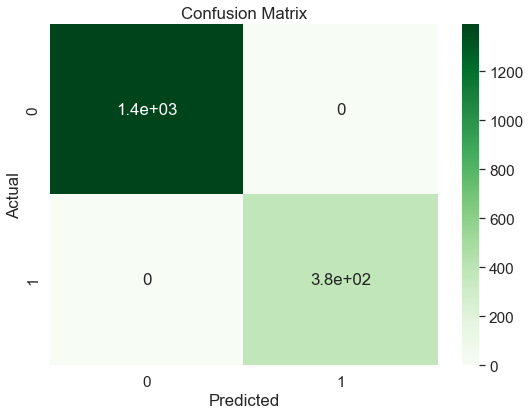

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [89]:
evaluate_model(best_random)

In [123]:
potentialMember = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.8]
len(potentialMember)

1447

Number of members found by Gao with a RF model with n_estimators = 7000:
* n(PMemb >= 0.6) = 1502
* n(PMemb >= 0.8) = 1361

In [118]:
print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))

n(PMemb >= 0.6) = 1489
n(PMemb >= 0.8) = 1447


In [124]:
potentialMember.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,member,PMemb
count,1.447000e+03,1.447000e+03,1.447000e+03,1447.0,1447.000000,1447.000000,1447.000000,1447.000000,1447.000000,1447.000000,...,993.000000,993.000000,993.000000,993.000000,993.000000,1447.000000,1447.000000,1447.000000,1447.0,1447.000000
mean,1.635721e+18,6.041167e+17,8.294698e+08,2015.5,132.849005,0.085953,11.812134,0.056315,1.130313,0.108454,...,1.426275,1.656038,4.284945,4.022831,4.547056,0.430140,0.000833,895.365425,1.0,0.989424
std,0.000000e+00,2.375146e+15,4.790455e+08,0.0,0.426118,0.095200,0.457069,0.062663,0.117265,0.120110,...,2.710798,3.078291,27.566442,25.980099,29.153673,0.444713,0.000882,105.198311,0.0,0.035357
min,1.635721e+18,5.975889e+17,1.427216e+06,2015.5,130.396966,0.018080,9.365995,0.011963,0.690116,0.021383,...,0.375463,0.586270,0.089308,0.071800,0.104245,0.000629,0.000149,688.571412,1.0,0.800861
25%,1.635721e+18,6.048931e+17,4.175658e+08,2015.5,132.689948,0.029674,11.666757,0.019788,1.083771,0.037633,...,0.746309,0.863935,0.338111,0.292283,0.375271,0.145641,0.000238,841.974964,1.0,0.999758
50%,1.635721e+18,6.049174e+17,8.276254e+08,2015.5,132.847883,0.045291,11.818210,0.028910,1.135503,0.056246,...,0.948455,1.079011,0.838277,0.767655,0.922710,0.287101,0.000484,880.666963,1.0,1.000000
75%,1.635721e+18,6.049632e+17,1.243858e+09,2015.5,133.012099,0.105870,11.982862,0.069102,1.187684,0.133968,...,1.295549,1.552644,2.391451,2.238927,2.520164,0.558784,0.001097,922.703740,1.0,1.000000
max,1.635721e+18,6.088616e+17,1.691157e+09,2015.5,135.277370,0.709851,14.297512,0.512493,1.452282,0.870812,...,48.507950,56.827263,586.685608,552.350098,621.021118,2.499166,0.004979,1449.032473,1.0,1.000000


#### Figure 4
PMemb from RF as a function of G band Magnitude and distance from cluster center.

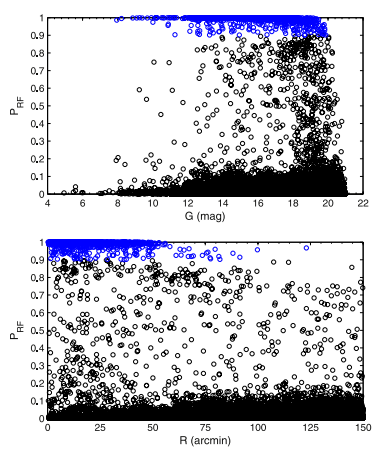

PMemb $\geq$ 0.9 are colored in blue.

In [92]:
sns.set(font_scale= 1.4)

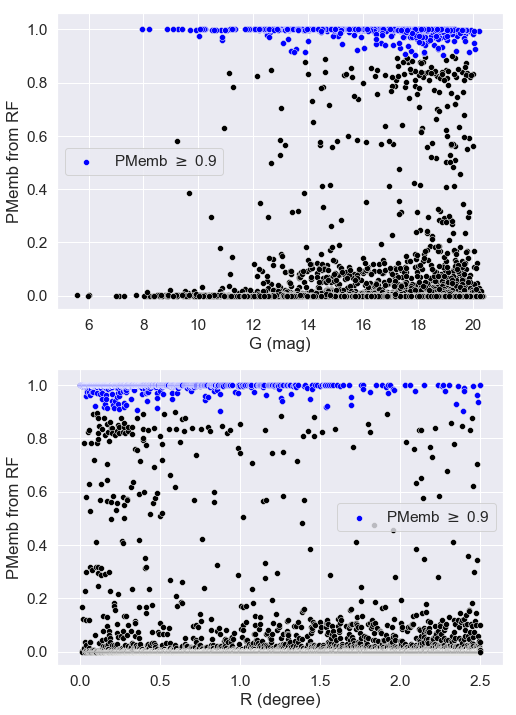

In [93]:
plt.figure(figsize = (8, 12))

PMemb_mask = GAIA_target_stars.PMemb >= 0.9
plt.subplot(211)
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('G (mag)')
plt.ylabel('PMemb from RF')
#plt.title('Member')

plt.subplot(212)
sns.scatterplot(x='dist', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='dist', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('R (degree)')
plt.ylabel('PMemb from RF')
plt.legend()
plt.show()

#### Figure 7: CMD

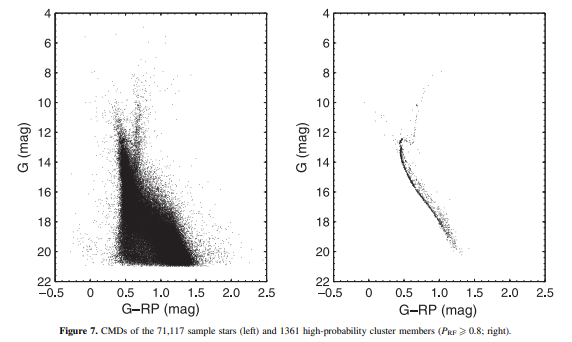

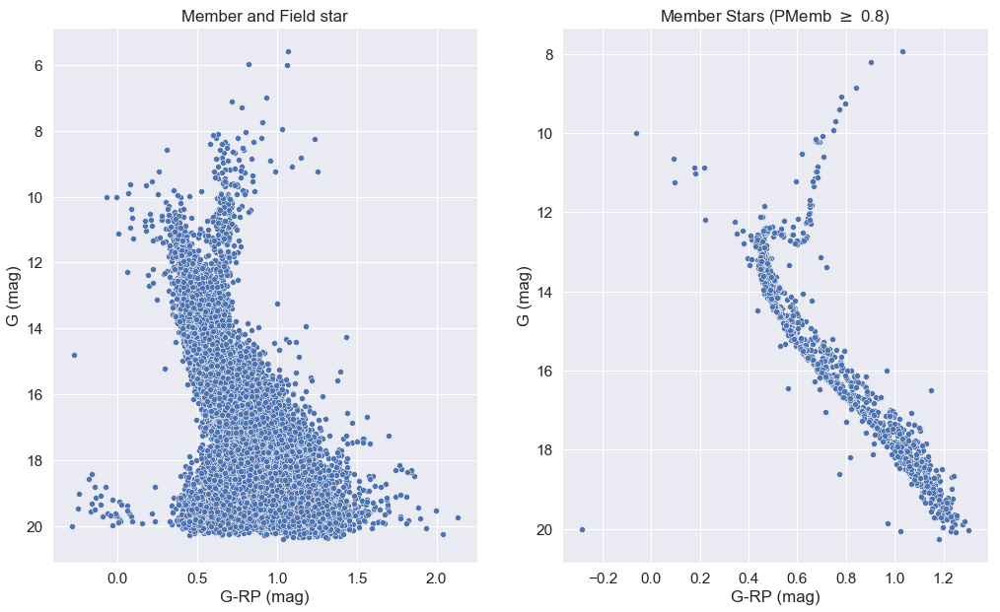

In [122]:
fig, axes = plt.subplots(1, 2, figsize=(17,10))
#fig.suptitle('CMD of RF prediction for M67')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = GAIA_target_stars, ax = axes[0], marker = 'o')
axes[0].set_title('Member and Field star')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

PMemb_mask = GAIA_target_stars.PMemb >= 0.8

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = 'o',
                data = GAIA_target_stars[PMemb_mask], ax = axes[1])
axes[1].set_title('Member Stars (PMemb $\geq$ 0.8)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

plt.show()

#### Figure 8
Comparison between GMM and RF membership probabilities

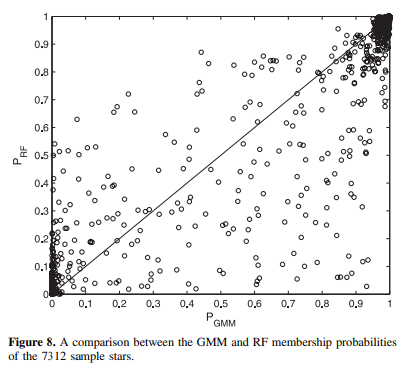

In [95]:
# find the RF membership probability of the working data for
# which we have the gmm membership probability of all stars
all_stars_feature = all_stars_filtered.loc[:, imp_feature_columns]
all_stars_filtered['PMemb_RF'] = best_random.predict_proba(all_stars_feature)[:,1]

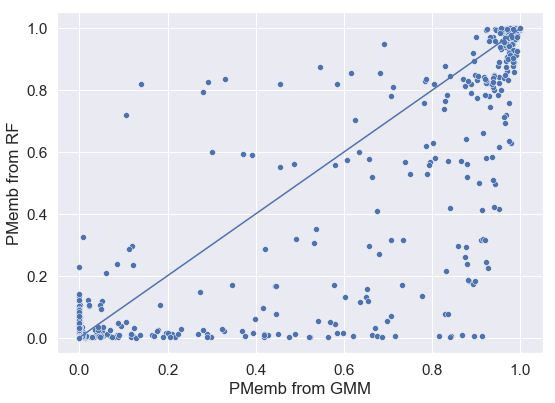

In [96]:
sns.scatterplot(x = 'PMemb', y = 'PMemb_RF', data = all_stars_filtered)
plt.ylabel('PMemb from RF')
plt.xlabel('PMemb from GMM')
plt.plot([0,1],[0,1])
plt.show()

### Other Visualization

**Distribution of the parameters**

In [129]:
member_mask = GAIA_target_stars.PMemb >= 0.8
field_mask = GAIA_target_stars.PMemb <= 0.8
potentialMember = GAIA_target_stars[member_mask]
potential_non_member = GAIA_target_stars[field_mask]

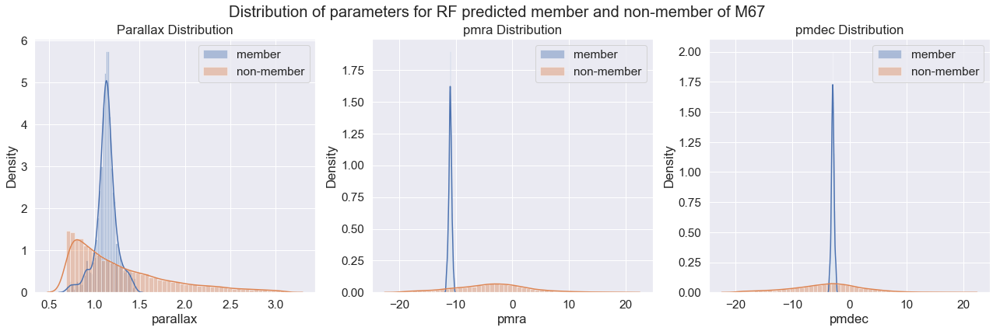

In [134]:
fig = plt.figure(figsize = (22,6))
fig.suptitle('Distribution of parameters for RF predicted member and non-member of M67')

plt.subplot(131)
sns.distplot(potentialMember.parallax, label='member')
sns.distplot(potential_non_member.parallax, label = 'non-member')
plt.title('Parallax Distribution')
plt.legend()

plt.subplot(132)
sns.distplot(potentialMember.pmra, label='member')
sns.distplot(potential_non_member.pmra, label = 'non-member')
plt.title('pmra Distribution')
plt.legend()

plt.subplot(133)
sns.distplot(potentialMember.pmdec, label='member')
sns.distplot(potential_non_member.pmdec, label = 'non-member')
plt.title('pmdec Distribution')
plt.legend()

plt.show()

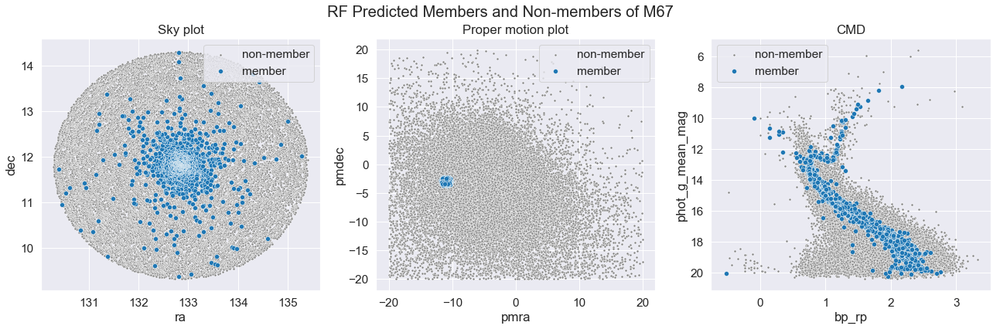

In [140]:
fig, axes = plt.subplots(1, 3, figsize=(22,6))
fig.suptitle('RF Predicted Members and Non-members of M67')

# sky plot
skyplot = sns.scatterplot(x='ra', y='dec', data=potential_non_member,
                label='non-member', ax=axes[0], marker = '.', color='grey')
skyplot = sns.scatterplot(x='ra', y='dec', data=potentialMember,
                label='member', ax=axes[0], color='tab:blue')
axes[0].set_title('Sky plot')

# proper motion plot
sns.scatterplot(x='pmra', y='pmdec', data=potential_non_member,
                label='non-member', ax=axes[1], marker = '.', color='grey')
sns.scatterplot(x='pmra', y='pmdec', data=potentialMember,
                label='member', ax=axes[1], color='tab:blue')
axes[1].set_title('Proper motion plot')

# CMD

cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=potential_non_member,
                label='non-member', ax=axes[2], marker = '.', color='grey')
cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=potentialMember,
                label='member', ax=axes[2], color='tab:blue')
cmd.invert_yaxis()
axes[2].set_title('CMD')

plt.show()

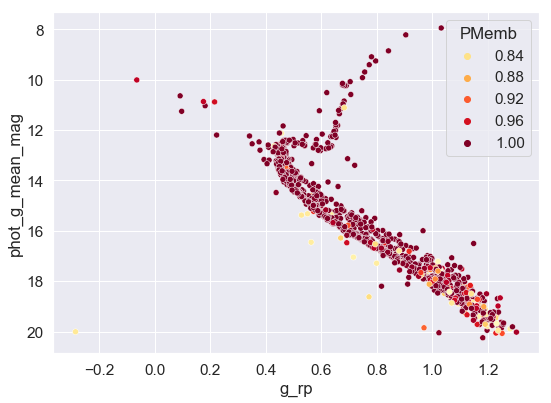

In [97]:
# CMD of predicted members 

cmd = sns.scatterplot(x = 'g_rp', y = 'phot_g_mean_mag', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.8] )
cmd.invert_yaxis()

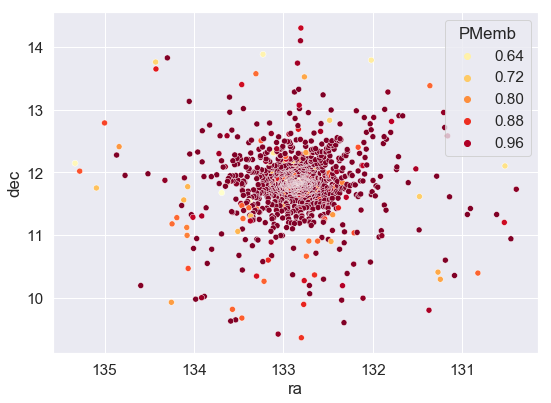

In [98]:
# skyplot
skyplot = sns.scatterplot(x = 'ra', y = 'dec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
skyplot.invert_xaxis()
plt.show()


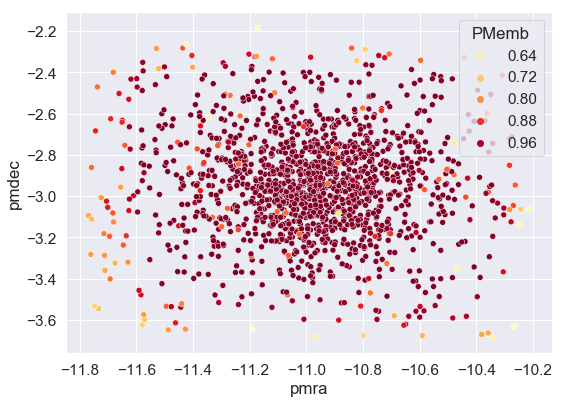

In [99]:
# pm plot
sns.scatterplot(x = 'pmra', y = 'pmdec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
plt.show()


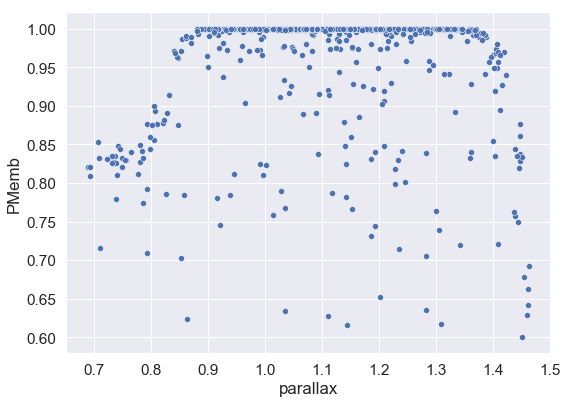

In [100]:
# parallax plot
sns.scatterplot(x = 'parallax', y = 'PMemb',  
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )

In [101]:
# saving the files as csv
# all_stars.to_csv('gaia_6405_membership_prob.csv')

potentialMember.to_csv('M_67_membership_prob.csv')


## Comparing with Cantat Benchmark

In [102]:
#### Finding Cantat catalogue

catalog_list = Vizier.find_catalogs('Cantat')
{k:v.description for k,v in catalog_list.items()}

{'I/349': 'StarHorse, Gaia DR2 photo-astrometric distances (Anders+, 2019)',
 'I/354': 'StarHorse2, Gaia EDR3 photo-astrometric distances (Anders+, 2022)',
 'J/A+A/561/A94': 'Velocities and photometry in Trumpler 20 (Donati+, 2014)',
 'J/A+A/564/A133': 'Gaia FGK benchmark stars: metallicity (Jofre+, 2014)',
 'J/A+A/569/A17': 'Gaia-ESO Survey: NGC6705 (Cantat-Gaudin+, 2014)',
 'J/A+A/582/A81': 'Gaia FGK benchmark stars: abundances (Jofre+, 2015)',
 'J/A+A/588/A120': 'Equivalent widths in 10 open clusters (Cantat-Gaudin+, 2016)',
 'J/A+A/591/A37': 'Gaia-ESO Survey. Parameters for cluster members (Jacobson+, 2016)',
 'J/A+A/597/A10': 'South Ecliptic Pole stars radial velocities (Fremat+, 2017)',
 'J/A+A/598/A68': 'Gaia-ESO Survey. Trumpler 23 (Overbeek+, 2017)',
 'J/A+A/601/A19': 'Gaia DR1 open cluster members (Gaia Collaboration+, 2017)',
 'J/A+A/603/A2': 'Gaia-ESO Survey abundances radial distribution (Magrini+, 2017)',
 'J/A+A/605/A79': 'TGAS Cepheids and RR Lyrae stars (Gaia Collabora

In [103]:
## saving only M67 data from Cantat
Vizier.ROW_LIMIT = -1

cantat_data = Vizier(catalog = 'J/A+A/633/A99/members', row_limit = -1).query_constraints(Cluster="NGC_2682")
cantat_data = cantat_data[0].to_pandas()
cantat_data.head()

,RA_ICRS,DE_ICRS,Source,Plx,pmRA,pmDE,RV,Gmag,BP-RP,Proba,Cluster,_RA.icrs,_DE.icrs
0,132.946529,11.353877,598696077168308992,1.2339,-10.911,-3.124,NaN,17.438299,2.0494,0.5,b'NGC_2682',132.946577,11.353890
1,132.801300,11.310755,598694939001774976,1.1585,-10.768,-2.795,NaN,13.923000,0.7829,0.5,b'NGC_2682',132.801347,11.310767
2,132.951477,11.302159,598692675554477056,1.1421,-11.195,-2.794,NaN,14.430800,0.8615,0.7,b'NGC_2682',132.951526,11.302171
3,132.890835,11.380829,598697142320464384,1.1938,-11.146,-2.894,NaN,12.622900,0.7340,0.7,b'NGC_2682',132.890884,11.380841
4,132.794558,11.317111,598695007721506432,1.1271,-10.988,-2.999,NaN,17.277000,1.7379,0.4,b'NGC_2682',132.794606,11.317124


In [104]:
# renaming the cantat table to match it with gaia_data
cantat_data = cantat_data.rename(columns={'Source':'source_id',
                                          'Proba':'PMemb_cantat'})

# taking the subset of only source_id and PMemb
cantat_data = cantat_data.loc[:,['source_id', 'PMemb_cantat']]

# join the two table on source_id
cantat_data = GAIA_target_stars.join(cantat_data.set_index('source_id'), on='source_id')

# dropping the rows, where we don't have PMemb_cantat 
# (i.e. the source id was not in the cantat table)
cantat_data = cantat_data.dropna(subset=['PMemb_cantat'])
cantat_data.head()

,solution_id,DESIGNATION,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,member,PMemb,PMemb_cantat
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,1,1.0,0.8
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,1,1.0,0.9
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,1,1.0,0.7
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,1,1.0,1.0
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,1,1.0,0.7


In [125]:
# creating subset for the member and Cantat Member

concatenated = pd.concat([potentialMember.assign(dataset='member_by_RF'), cantat_data.assign(dataset='cantat')])
concatenated.reset_index(drop=True)
concatenated.dataset.value_counts()

member_by_RF    1447
cantat           845
Name: dataset, dtype: int64

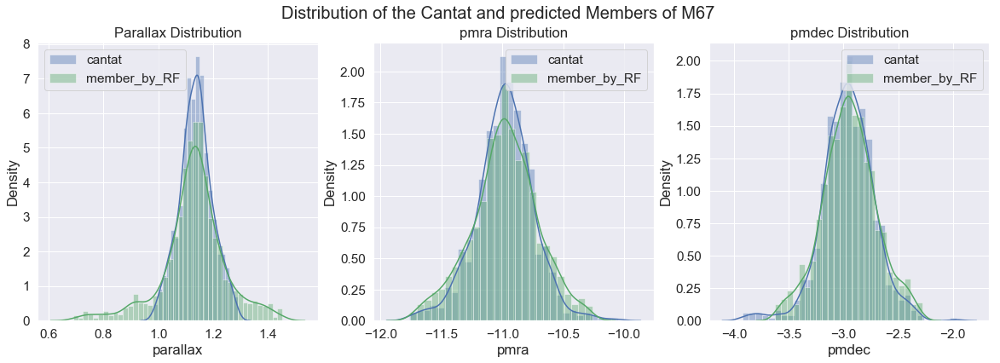

In [126]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Distribution of the Cantat and predicted Members of M67')


sns.distplot(cantat_data['parallax'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[0])
sns.distplot(potentialMember['parallax'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[0])
axes[0].set_title('Parallax Distribution')
axes[0].legend()

sns.distplot(cantat_data['pmra'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[1])
sns.distplot(potentialMember['pmra'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[1])
axes[1].set_title('pmra Distribution')
axes[1].legend()

sns.distplot(cantat_data['pmdec'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[2])
sns.distplot(potentialMember['pmdec'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[2])
axes[2].set_title('pmdec Distribution')
axes[2].legend()

plt.show()


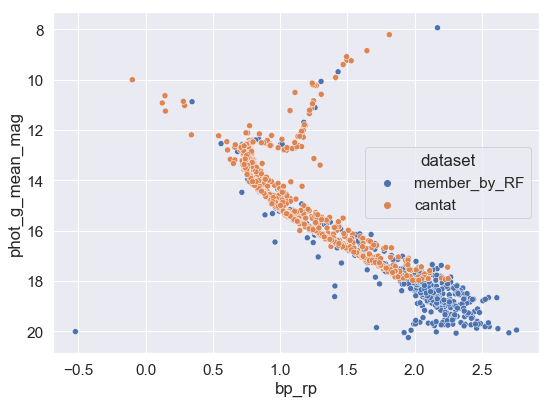

In [127]:
cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset')
cmd.invert_yaxis()

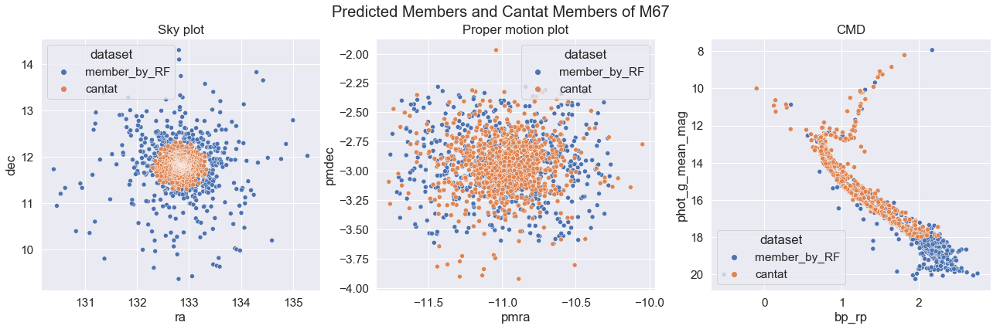

In [132]:
fig, axes = plt.subplots(1, 3, figsize=(22,6))
fig.suptitle('Predicted Members and Cantat Members of M67')

skyplot = sns.scatterplot(x='ra', y='dec', data=concatenated,
                hue='dataset', ax=axes[0])
axes[0].set_title('Sky plot')

# proper motion plot
sns.scatterplot(x='pmra', y='pmdec', data=concatenated,
                hue='dataset', ax=axes[1])
axes[1].set_title('Proper motion plot')

cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset', ax=axes[2])
cmd.invert_yaxis()
axes[2].set_title('CMD')

plt.show()